In [1]:
# Checkpoint 1:
# Datenset mandelbrot_gallery berechnet
# Mix aus zwei Algorithmen verwendet

import numpy as np
import matplotlib.pyplot as plt
%matplotlib inline

from numba import jit, njit, prange

import mpmath
from mpmath import mpf, mpc


In [2]:
%load_ext autoreload
%autoreload 2
from mandel_algorithms import *

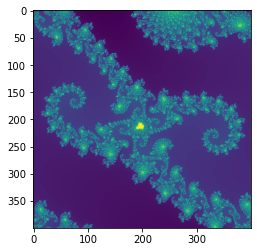

In [3]:

'Stärkerer Zoom'
mid = -0.743642, 0.13183
width = 0.000116
xarr = np.linspace(mid[0]-width/2, mid[0]+width/2, 400)
yarr = np.linspace(mid[1]-width/2, mid[1]+width/2, 400)
nmax = 1000

xarr, yarr = meshgrid(xarr, yarr)

mandel = mandelbrot(xarr, yarr, nmax)
mandel

plt.imshow(np.log(mandel.T[::-1]))

In [4]:
## Autoencoder
import torch
from torch import nn
from utils import *

class Encoder(nn.Module):
    def __init__(self, n=64, h=512):
        super().__init__()
        
        self.maxpool = nn.MaxPool2d(2)
        self.actv = nn.ELU(0.1)
        
        self.conv0 = nn.Conv2d(1, n, 3, padding=1)
        
        self.conv1 = nn.Conv2d(n, n, 3, padding=1)
        self.conv2 = nn.Conv2d(n, 2*n, 3, padding=1)
        
        self.conv3 = nn.Conv2d(2*n, 2*n, 3, padding=1)
        self.conv4 = nn.Conv2d(2*n, 3*n, 3, padding=1)
        
        self.conv5 = nn.Conv2d(3*n, 3*n, 3, padding=1)
        self.conv6 = nn.Conv2d(3*n, 3*n, 3, padding=1)
        
        self.fc = nn.Linear(16*16*3*n, h)
        
        self.cuda()
        
    def forward(self, x):
        actv = self.actv
        
        x = x.reshape(-1, 1, 64, 64)
        
        x = actv(self.conv0(x))
        
        x = actv(self.conv1(x))
        x = actv(self.conv2(x))
        self.xc2 = x
        x = self.maxpool(x)
        
        x = actv(self.conv3(x))
        x = actv(self.conv4(x))
        self.xc4 = x
        x = self.maxpool(x)
        
        x = actv(self.conv5(x))
        x = actv(self.conv6(x))
        self.xc6 = x
        
        x = torch.flatten(x, start_dim=1)
        x = self.fc(x)
        
        return x
        
        
class Decoder(nn.Module):
    def __init__(self, n=64, h=512):
        super().__init__()
        
        self.upsample = nn.UpsamplingNearest2d(scale_factor=2)
        self.actv = nn.ELU()
        
        self.fc = nn.Linear(h, 16*16*n)
        
        self.conv1 = nn.Conv2d(n, n, 3, padding=1)
        self.conv2 = nn.Conv2d(n, n, 3, padding=1)
        
        self.conv3 = nn.Conv2d(2*n, n, 3, padding=1)
        self.conv4 = nn.Conv2d(n, n, 3, padding=1)
        
        self.conv5 = nn.Conv2d(2*n, n, 3, padding=1)
        self.conv6 = nn.Conv2d(n, n, 3, padding=1)
        
        self.conv7 = nn.Conv2d(n, 1, 3, padding=1)
        
        self.cuda()
        
    def forward(self, x):
        
        actv = self.actv
        
        h0 = actv(self.fc(x))
        h0 = h0.reshape(x.size(0), -1, 16, 16)
        
        x = h0
        x = actv(self.conv1(x))
        x = actv(self.conv2(x))
        x = self.upsample(x)
        
        h0 = self.upsample(h0)
        x = torch.cat((x, h0), 1)
        x = actv(self.conv3(x))
        x = actv(self.conv4(x))
        x = self.upsample(x)
        
        h0 = self.upsample(h0)
        x = torch.cat((x, h0), 1)
        x = actv(self.conv5(x))
        x = actv(self.conv6(x))
        
        x = self.conv7(x)
        
        x = x.reshape(-1, 64, 64)
        
        return x
        
class Autoencoder(nn.Module):
    def __init__(self, n=64):
        super().__init__()
        self.enc = Encoder(n)
        self.dec = Decoder(n)
    def forward(self, x, eps=0.):
        eps = x + eps*torch.rand_like(x)
        return self.dec(self.enc(x))
    

net = Autoencoder()
net.iters = 0
net.optim = torch.optim.Adam(lr=0.001, betas=(0.9, 0.999), params=net.parameters())

  0%|          | 0/200 [00:00<?, ?it/s]

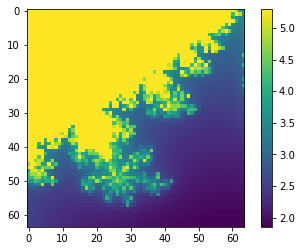

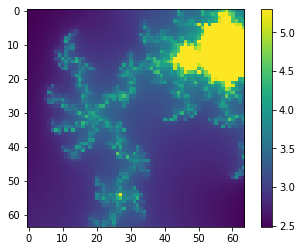

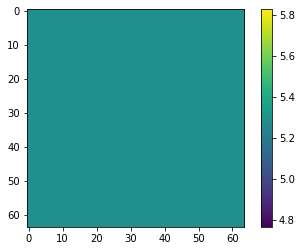

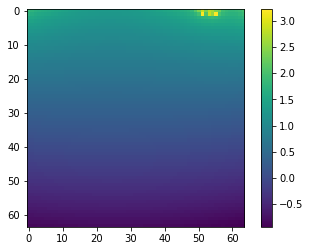

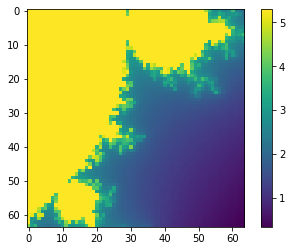

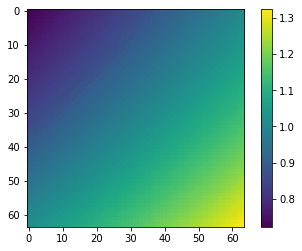

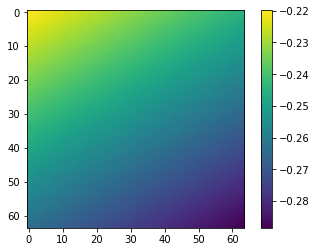

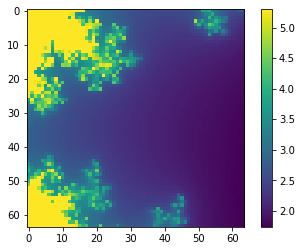

C:\ProgramData\Anaconda3\lib\site-packages\ipykernel_launcher.py:13: RuntimeWarning: invalid value encountered in log
  del sys.path[0]


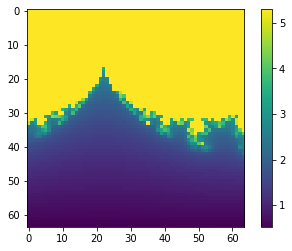

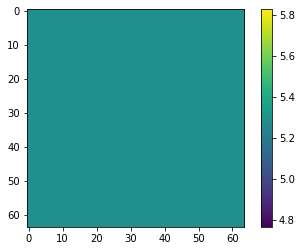

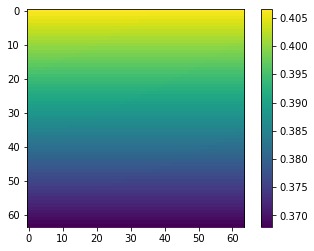

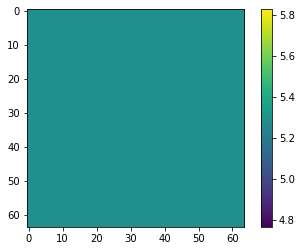

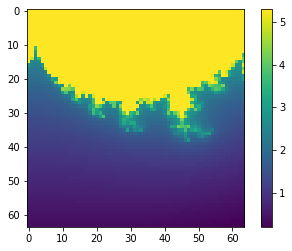

...

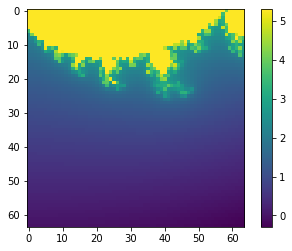

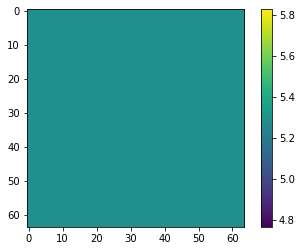

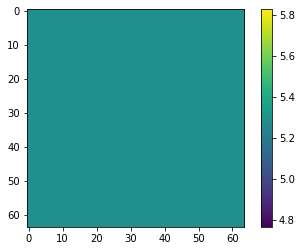

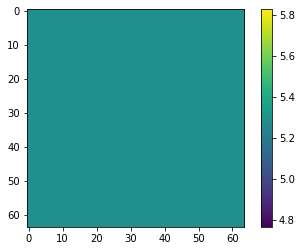

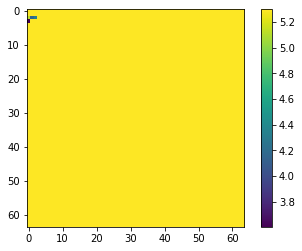

In [5]:
from tqdm.notebook import tqdm
replaybuffer = []
np.random.seed(0)
for _ in tqdm(range(200)):
    mid = np.random.rand()*1.5-0.5, np.random.rand()*2-1
    width = np.random.choice([0.5, 0.1, 0.01])
    xarr = np.linspace(mid[0]-width/2, mid[0]+width/2, 64)
    yarr = np.linspace(mid[1]-width/2, mid[1]+width/2, 64)
    nmax = 200
    xarr, yarr = meshgrid(xarr, yarr)
    
    mandel = mandelbrot(xarr, yarr, nmax)
    mandel = np.log(mandel)
    if np.any(np.isnan(mandel)): continue
    plt.imshow(mandel)
    plt.colorbar()
    plt.show()
    replaybuffer.append(mandel)
    
replaybuffer = np.asarray(replaybuffer)

In [6]:
bnum = 64

def trainstep(indf=None):
    if type(indf) is type(None):
        indf = lambda: np.random.randint(len(replaybuffer), size=bnum)
    net.iters += 1
    net.zero_grad()
    t = replaybuffer[indf()]
    t = (t - t.mean((1,2), keepdims=True)) / (t.std((1,2), keepdims=True)+1e-2)
    t = t.clip(-3, 3)
    t = np2t(augment8(t))
    p = net(t, eps=2)

    loss = l1l2(p,t).mean()
    loss.backward()
    net.optim.step()
    
    '''
    plt.imshow(t2np(p)[0])    
    plt.show()
    plt.imshow(t2np(t)[0])
    plt.show()'''
    
    return loss.item()

In [7]:
for _ in range(200):
    print(trainstep())

0.7132004499435425
0.7119960784912109
0.5961412191390991
0.6240822076797485
0.6977139711380005
4.486210823059082
0.708806037902832
0.6034653186798096
0.7415481805801392
0.6939063668251038
0.6123918294906616
0.6272606253623962
0.7328542470932007
0.7353259325027466
0.6559700965881348
0.6622906923294067
0.6608330011367798
0.7273225784301758
0.7121098041534424
0.8430153727531433
0.7037792205810547
0.6582350730895996
0.9391076564788818
0.8298400640487671
0.6870169639587402
0.6164535284042358
0.6474829912185669
0.6581724286079407
0.6430100798606873
0.8217319250106812
0.7518739700317383
0.7326207160949707
0.7187119722366333
0.6399228572845459
0.7148118019104004
0.6216314435005188
0.8124158382415771
0.7665982842445374
0.6677549481391907
0.6851537227630615
0.7004686594009399
0.7936215996742249
0.8046067953109741
0.742079496383667
0.759285569190979
0.6412150859832764
0.6730188727378845
0.6998316049575806
0.7018922567367554
0.7032172679901123
0.6970778107643127
0.6474694013595581
0.75208187103271

In [8]:
def _cost(imgs):
    if len(imgs)==0: return []
    t = imgs
    t = (t - t.mean((1,2), keepdims=True)) / (t.std((1,2), keepdims=True)+1e-2)
    t = t.clip(-3, 3)
    t = np2t(t)
    p = net(t)
    c = t2np(l1l2(p,t)).mean((1,2))
    return c

def cost(imgs):
    if len(imgs) > bnum:
        return np.concatenate([ _cost(imgs[bnum*i:bnum*(i+1)]) for i in range(int(len(imgs)//bnum)+1) ])
    else:
        return _cost(imgs)

In [9]:
cs = _cost(replaybuffer[:])

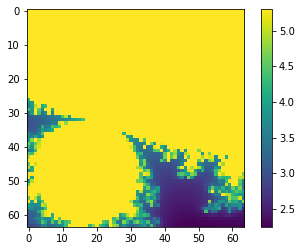

0.44656008


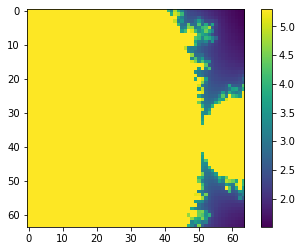

0.40789512


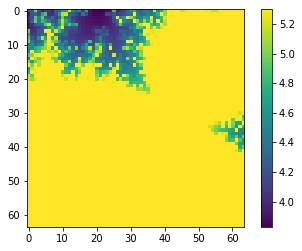

0.34019366


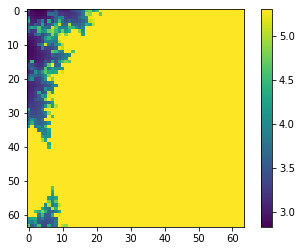

0.32959703


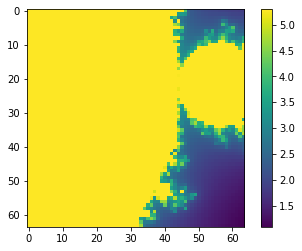

0.3286282


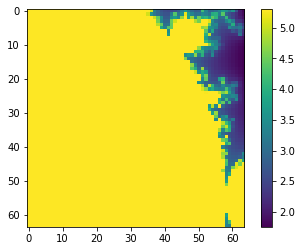

0.32344466


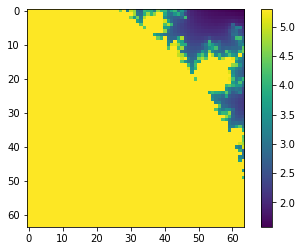

0.30792433


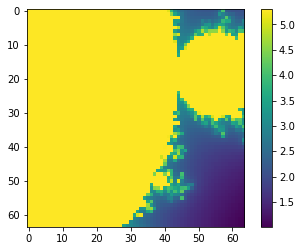

0.28192487


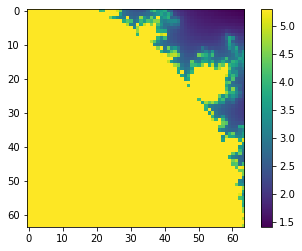

0.27969822


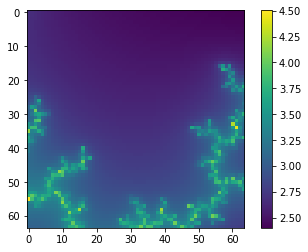

0.2638253


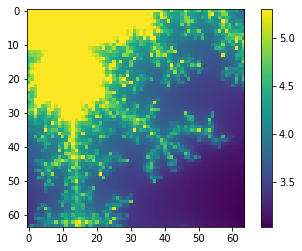

0.2575134


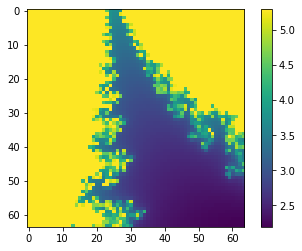

0.2550083


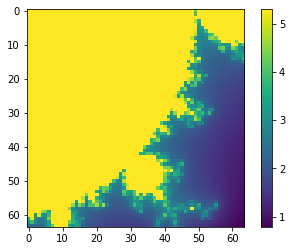

0.24786481


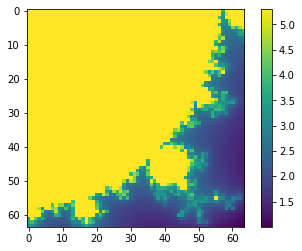

0.24030268


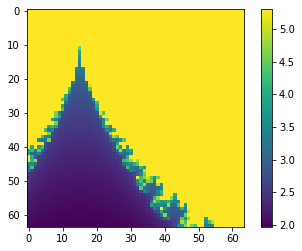

0.23995581


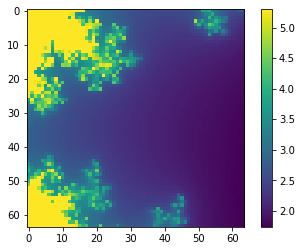

0.23464622


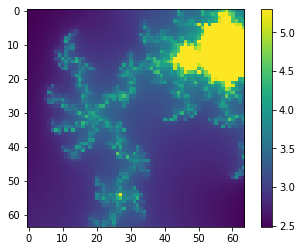

0.2312375


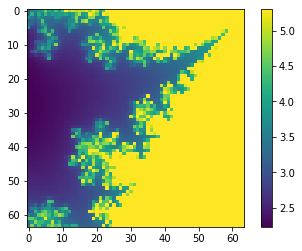

0.22772785


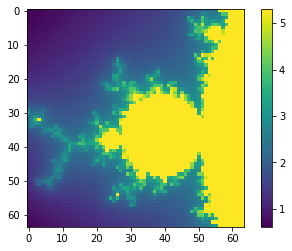

0.22770965


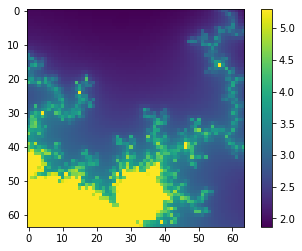

0.22189009


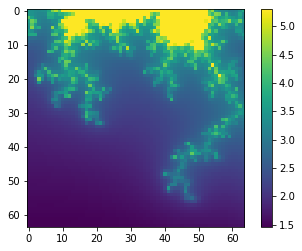

0.22124517


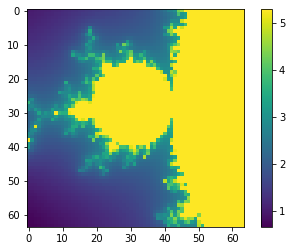

0.20504051


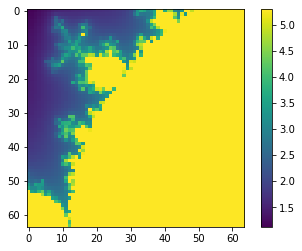

0.20227358


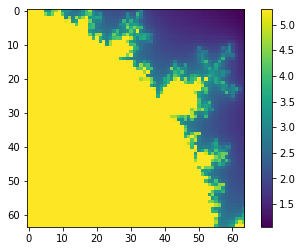

0.19744578


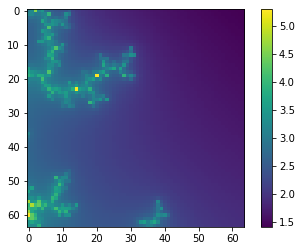

0.19637462


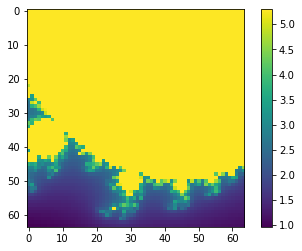

0.19557273


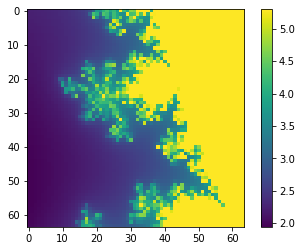

0.19122474


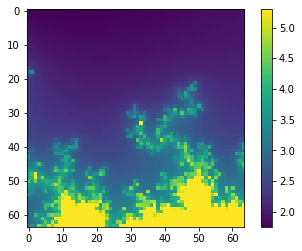

0.18918747


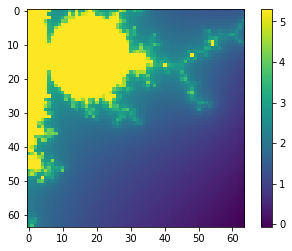

0.18687427


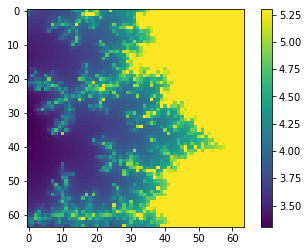

0.18641649


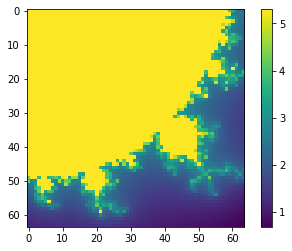

0.1857177


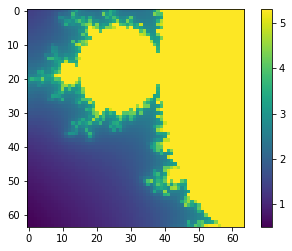

0.18019286


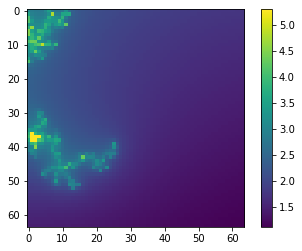

0.17240272


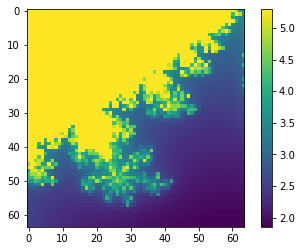

0.17103389


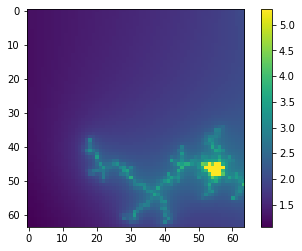

0.16587155


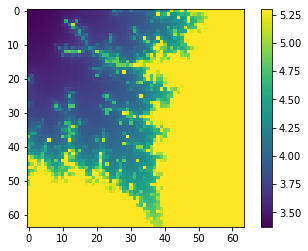

0.16369306


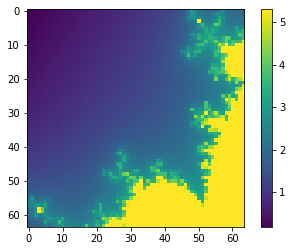

0.16231391


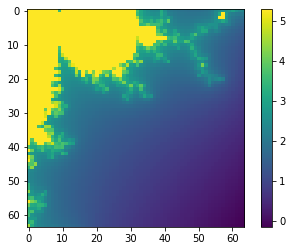

0.16028914


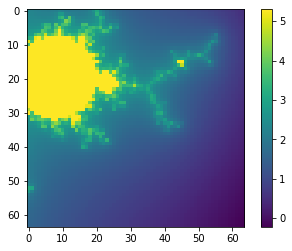

0.15843087


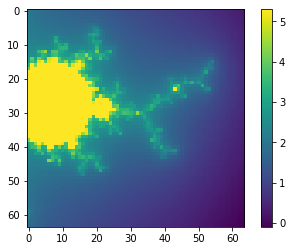

0.15454362


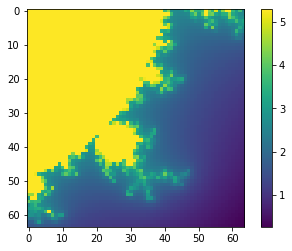

0.15378284


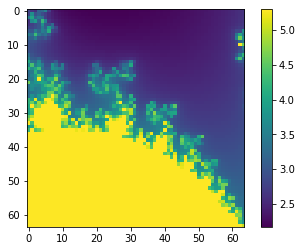

0.15267706


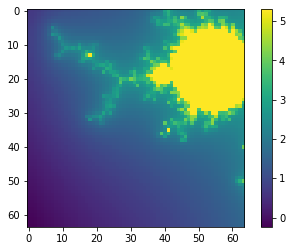

0.15247867


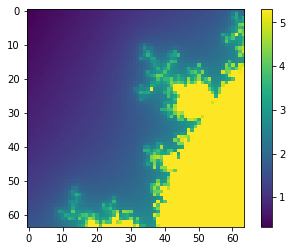

0.1436637


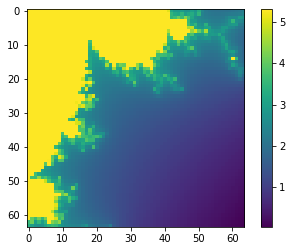

0.14142975


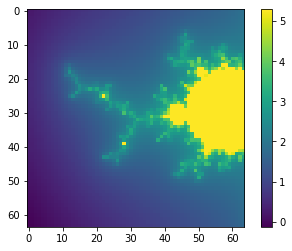

0.1411039


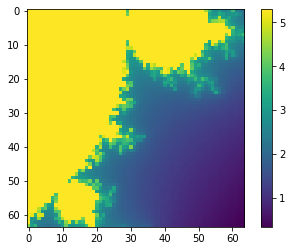

0.13394846


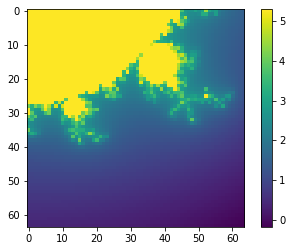

0.13292447


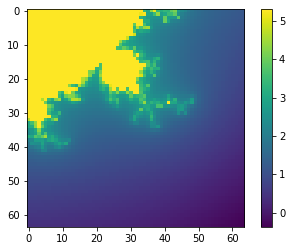

0.13195696


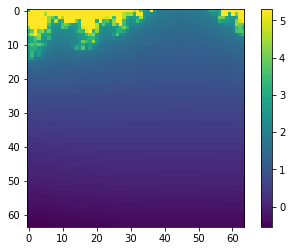

0.12926371


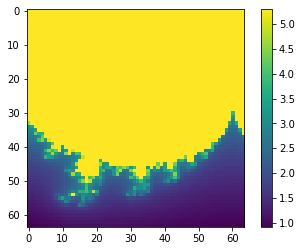

0.1260888


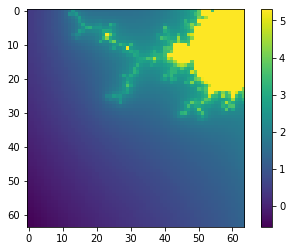

0.12518859


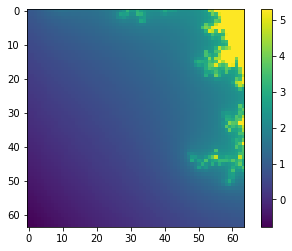

0.12218253


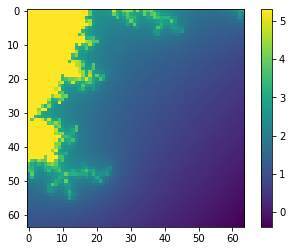

0.122171715


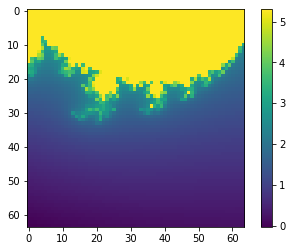

0.12103006


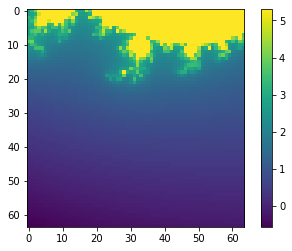

0.12070586


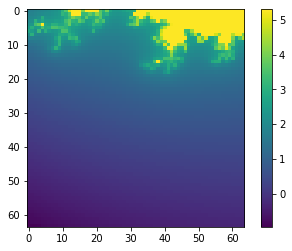

0.115854226


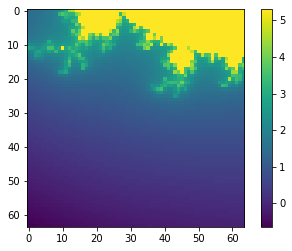

0.1154068


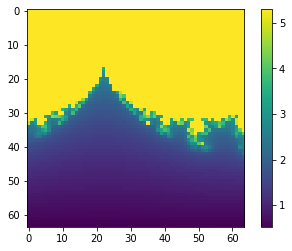

0.11094409


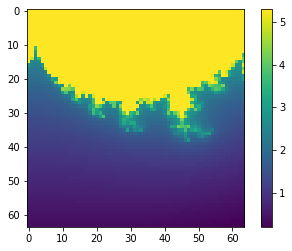

0.10666749


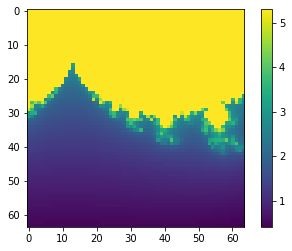

0.106637836


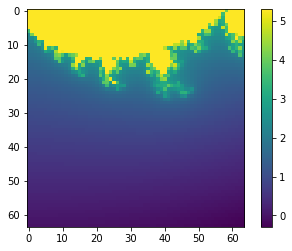

0.10625454


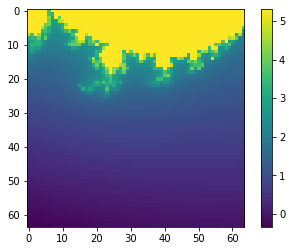

0.105294935


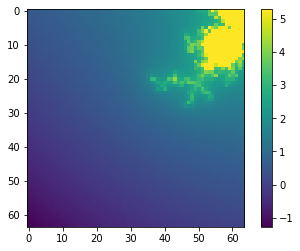

0.09600032


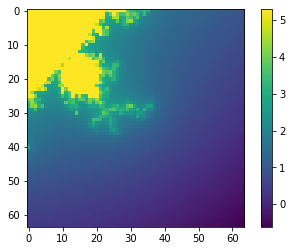

0.09382024


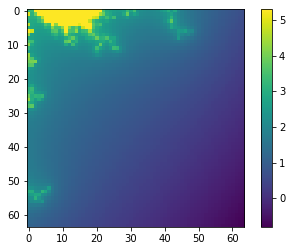

0.09032351


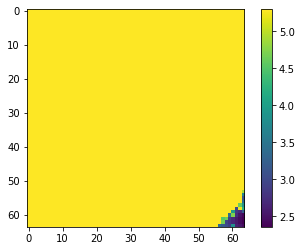

0.082913525


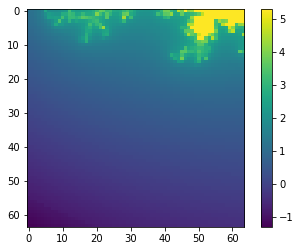

0.080999464


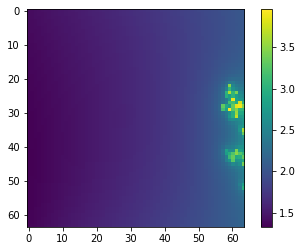

0.070292674


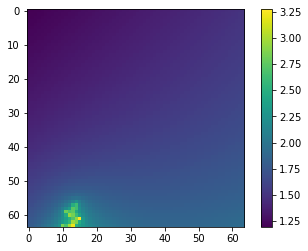

0.06668545


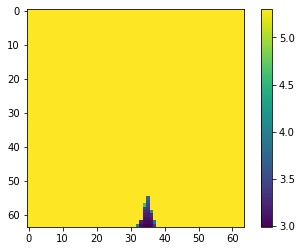

0.06633413


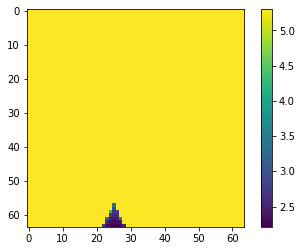

0.06372885


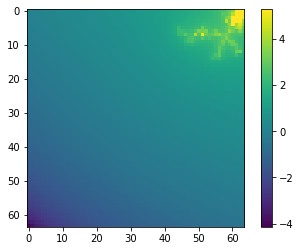

0.058706466


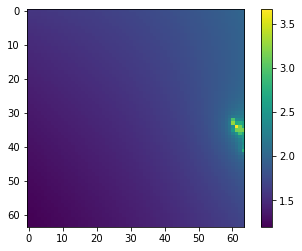

0.052415807


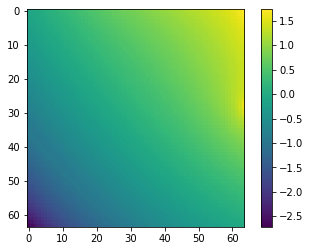

0.043631166


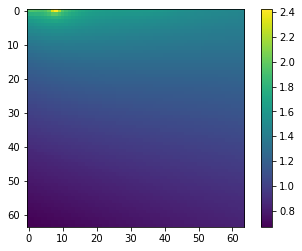

0.040917277


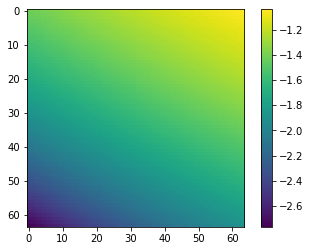

0.04073547


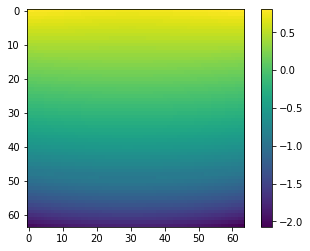

0.04044644


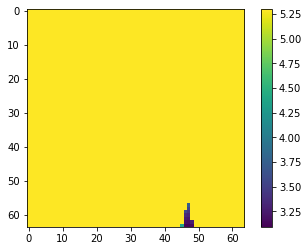

0.040342294


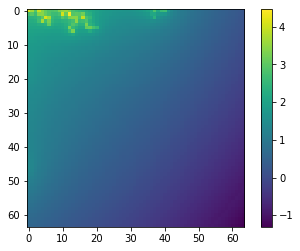

0.04028423


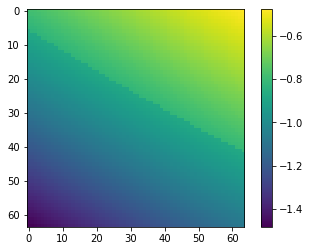

0.0402142


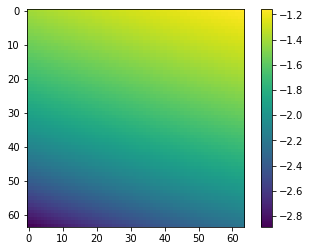

0.039469503


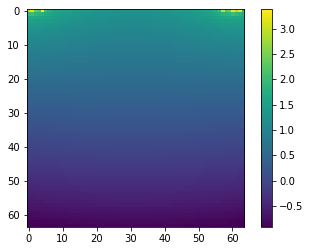

0.039281294


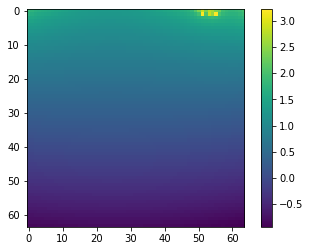

0.037701935


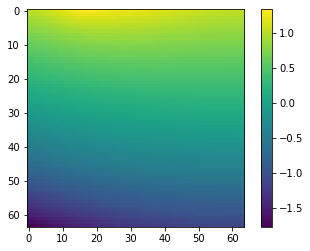

0.037299


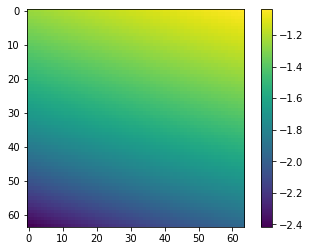

0.037110284


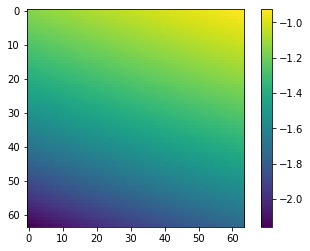

0.036779754


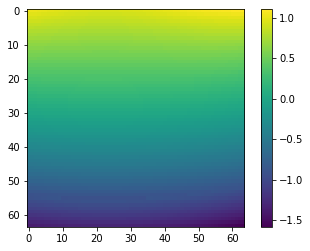

0.03508775


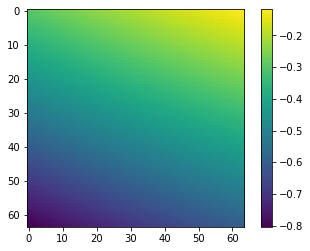

0.034228414


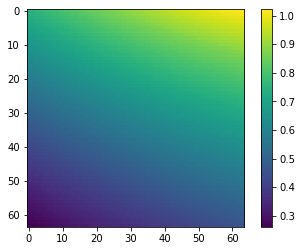

0.034090504


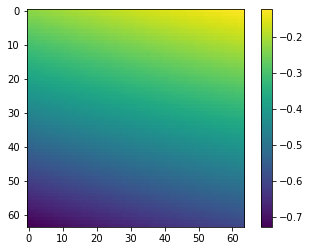

0.03276591


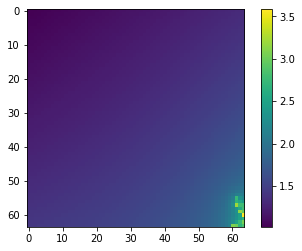

0.030512413


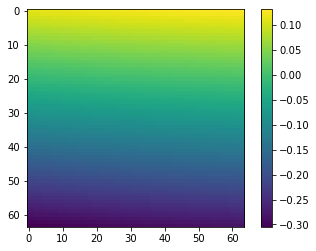

0.02946464


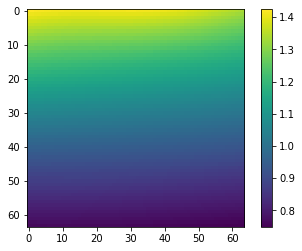

0.029358301


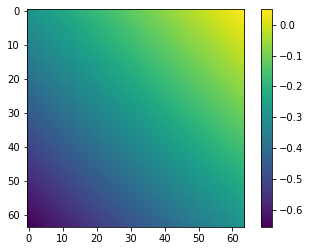

0.028722417


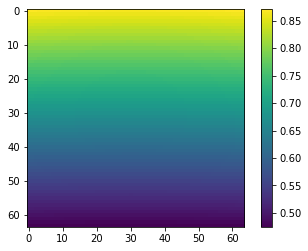

0.02862329


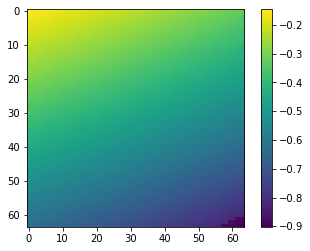

0.028477872


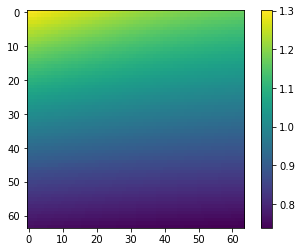

0.027945612


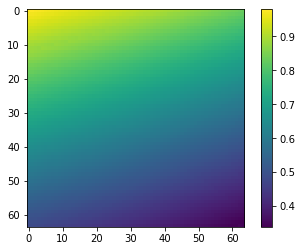

0.027438324


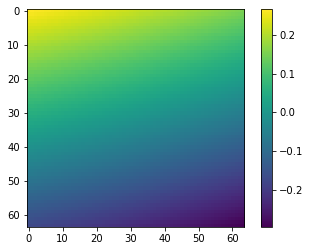

0.027353613


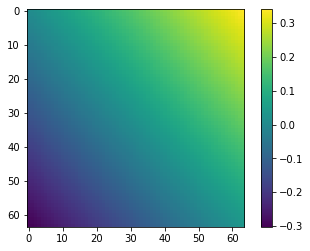

0.026866727


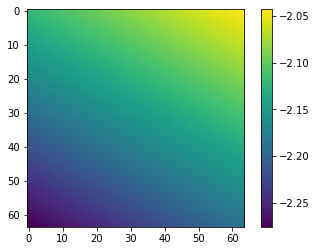

0.026862826


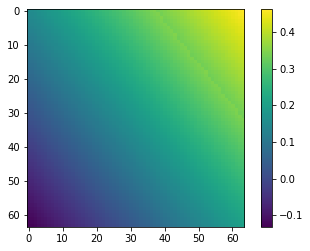

0.026442733


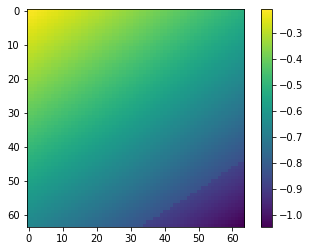

0.026305422


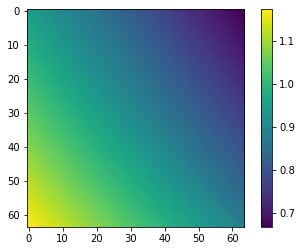

0.025604071


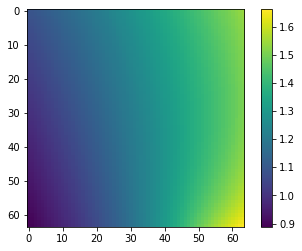

0.025467377


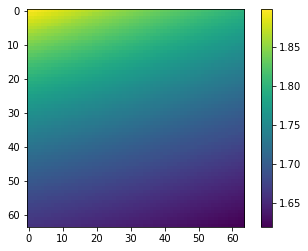

0.024233952


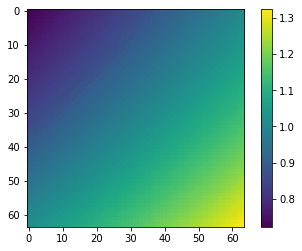

0.02421026


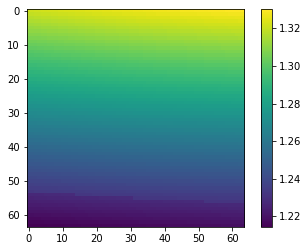

0.022756357


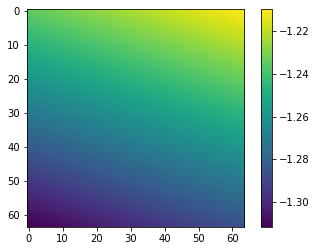

0.020911667


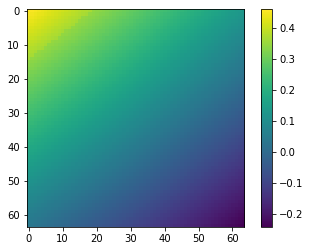

0.020487705


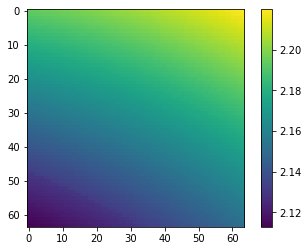

0.020156853


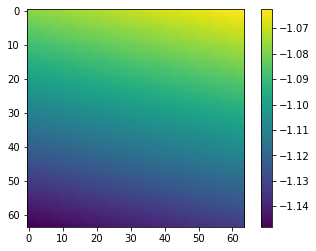

0.019857988


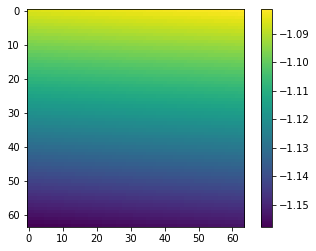

0.01962148


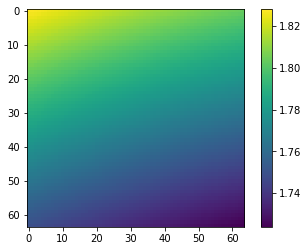

0.019460753


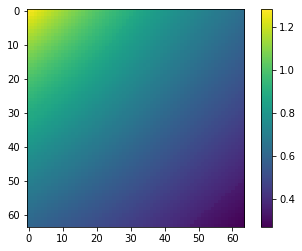

0.018855978


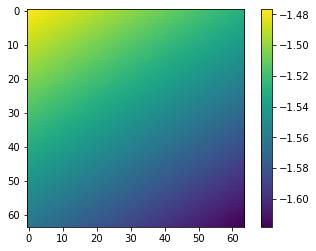

0.0186587


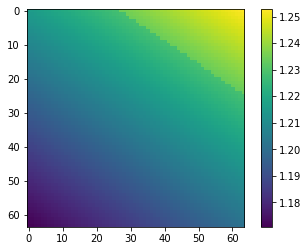

0.018588949


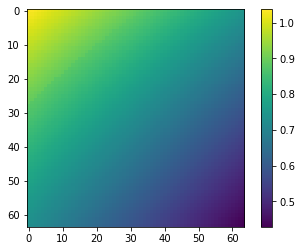

0.018056136


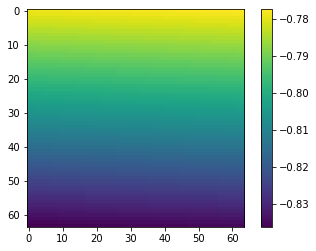

0.017637566


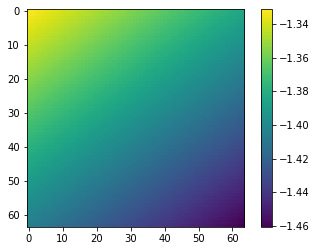

0.017383248


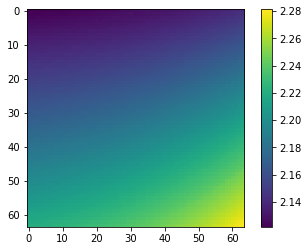

0.017101288


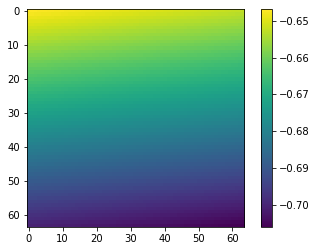

0.017048068


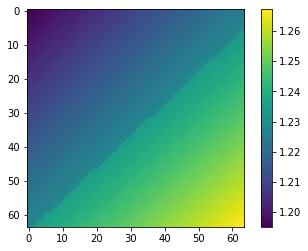

0.016969902


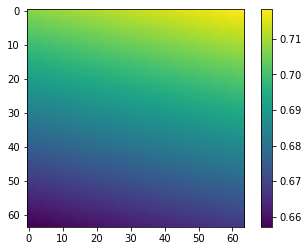

0.016797207


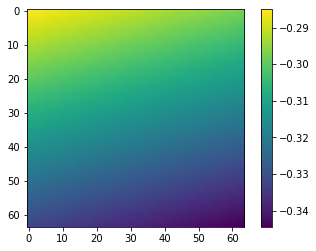

0.016205788


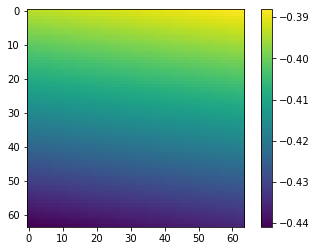

0.016049448


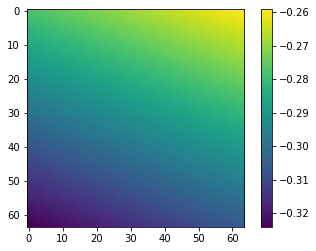

0.015950032


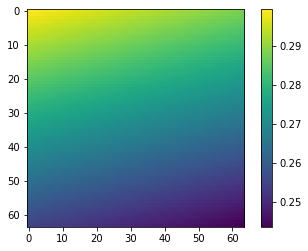

0.01584616


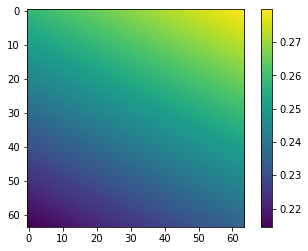

0.01546292


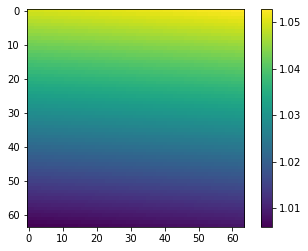

0.015434412


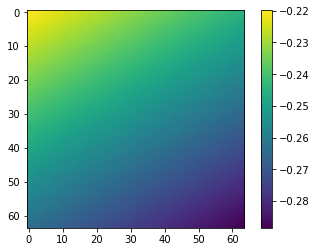

0.015427448


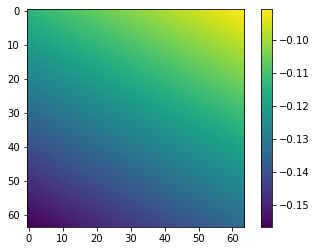

0.015333463


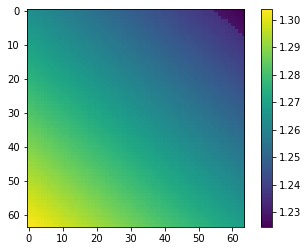

0.015294606


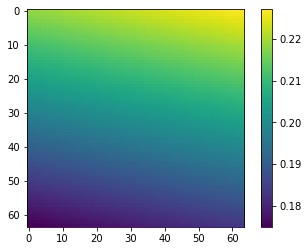

0.015286842


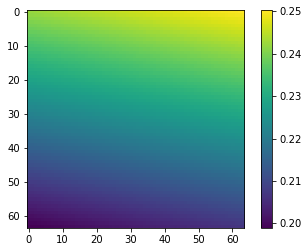

0.015255347


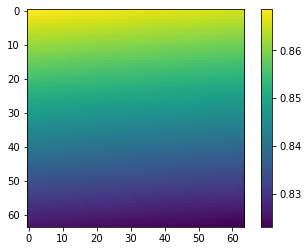

0.015229091


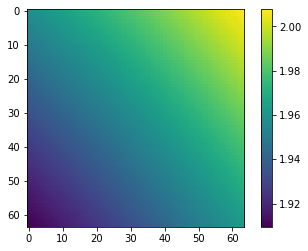

0.015152411


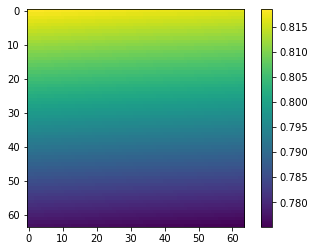

0.014920036


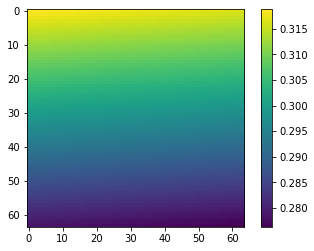

0.014688537


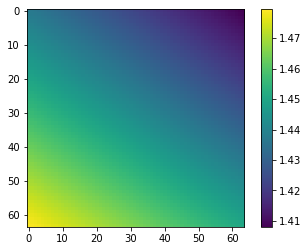

0.014601003


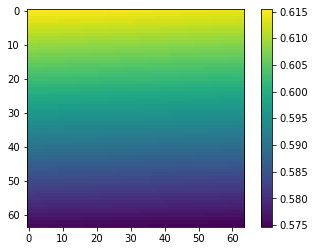

0.0145342965


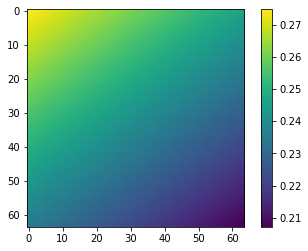

0.01444722


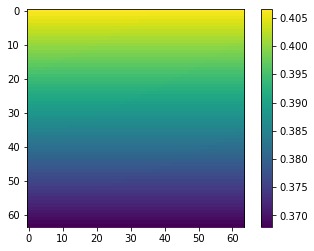

0.0142322425


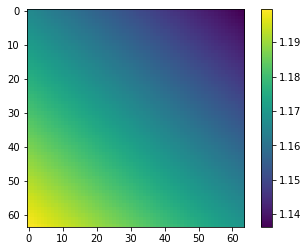

0.013730656


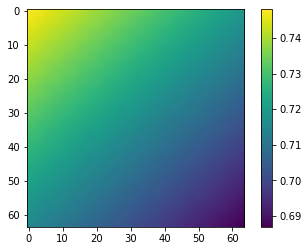

0.013105844


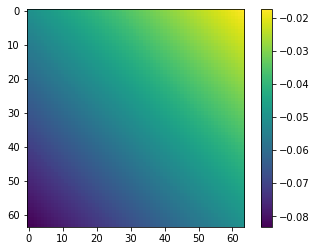

0.011883793


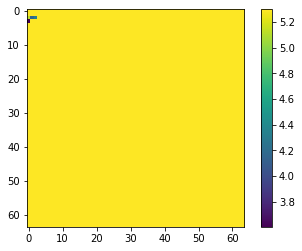

0.0115477685


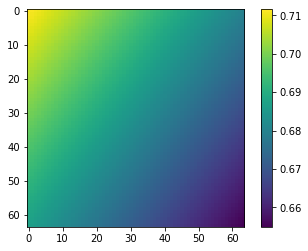

0.011366804


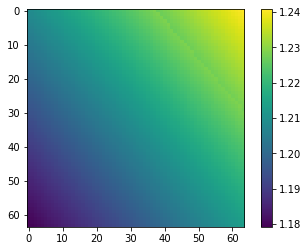

0.010609233


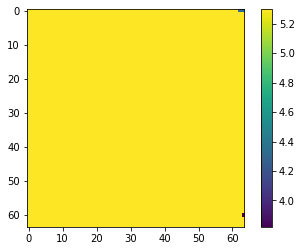

0.009226948


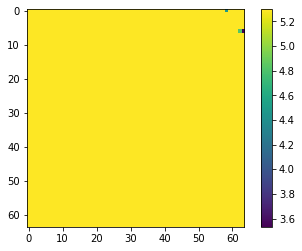

0.009092696


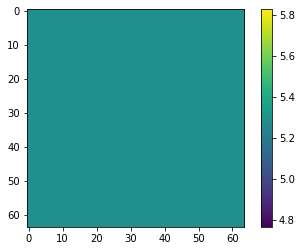

0.00047492154


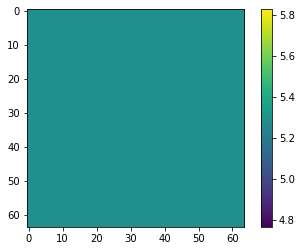

0.00047492154


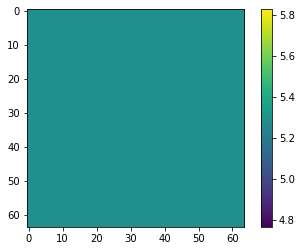

0.00047492154


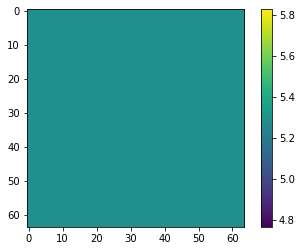

0.00047492154


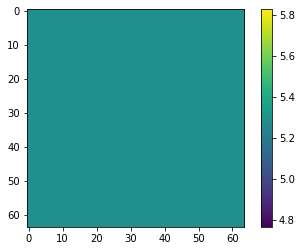

0.00047492154


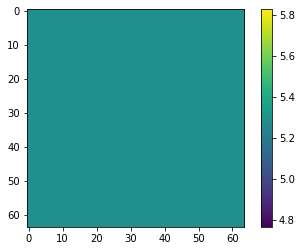

0.00047492154


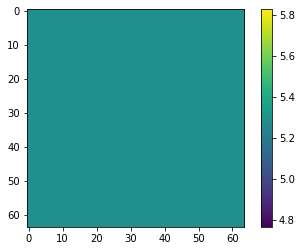

0.00047492154


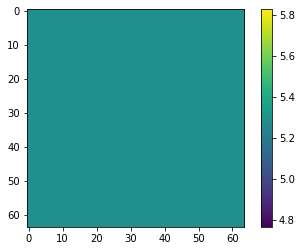

0.00047492154


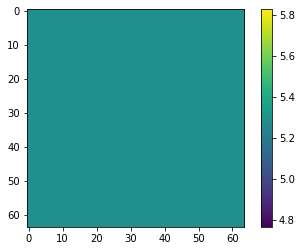

0.00047492154


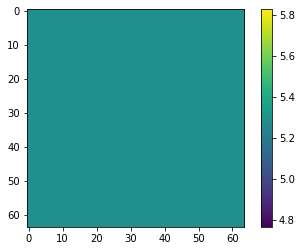

0.00047492154


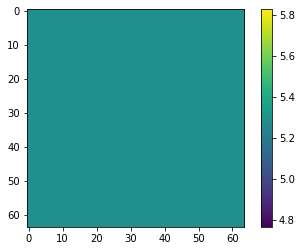

0.00047492154


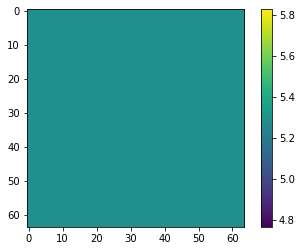

0.00047492154


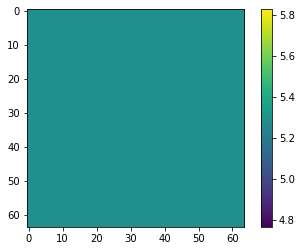

0.00047492154


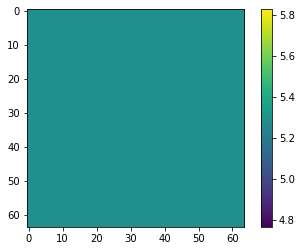

0.00047492154


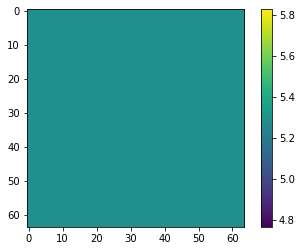

0.00047492154


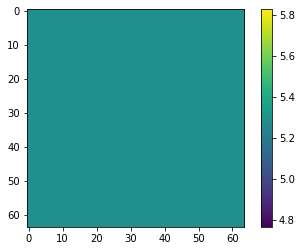

0.00047492154


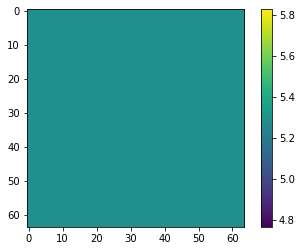

0.00047492154


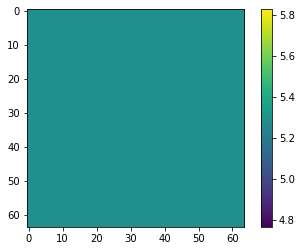

0.00047492154


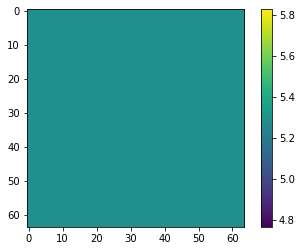

0.00047492154


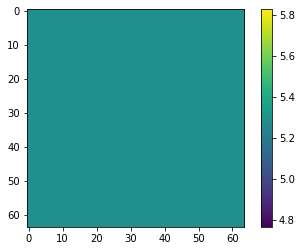

0.00047492154


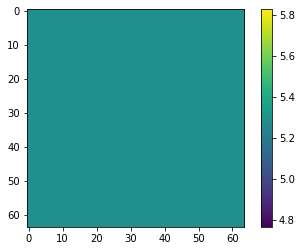

0.00047492154


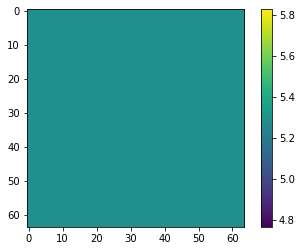

0.00047492154


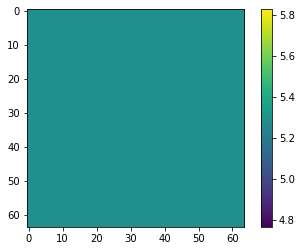

0.00047492154


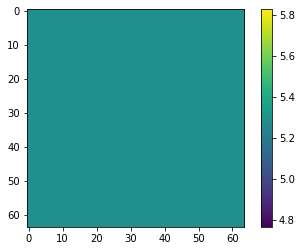

0.00047492154


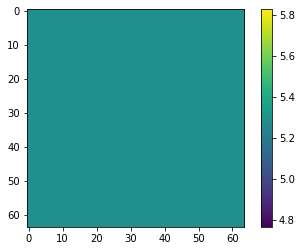

0.00047492154


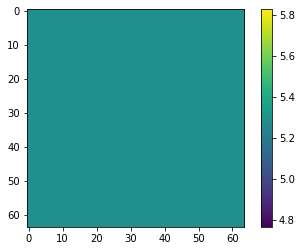

0.00047492154


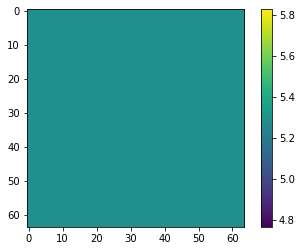

0.00047492154


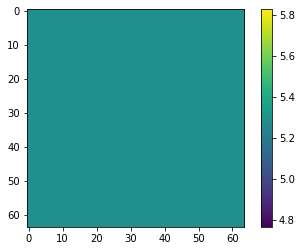

0.00047492154


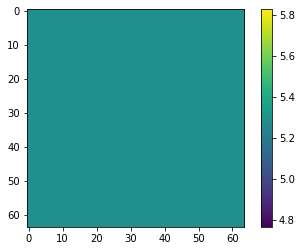

0.00047492154


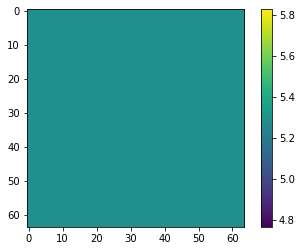

0.00047492154


KeyboardInterrupt: 

In [14]:
for i in np.argsort(-cs)[:]:
    plt.imshow(replaybuffer[i])
    plt.colorbar()
    plt.show()
    print(cs[i])

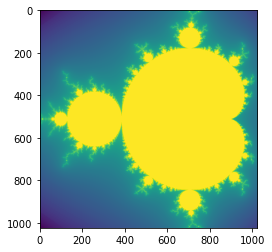

In [10]:

xarr = np.linspace(-1.5, 0.5, 1024)
yarr = np.linspace(-1, 1, 1024)
nmax = 200
xarr, yarr = meshgrid(xarr, yarr)

mandel = mandelbrot(xarr, yarr, nmax)
mandel = np.log(mandel)

plt.imshow(mandel.T[::-1])

In [11]:
parts = mandel.reshape(16, 64, 16, 64)
parts = parts.transpose(0, 2, 1, 3).reshape((-1, 64, 64))

c = [_cost(parts[i:i+1]) for i in range(len(parts))]
c = np.asarray(c).reshape(16, 16)

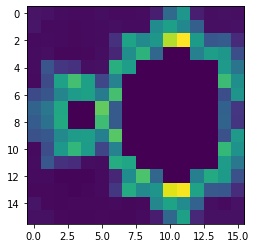

In [12]:
plt.imshow(c.T[::-1])

In [13]:
nrec = 10

def recursion(xmin, xmax, ymin, ymax, n=0, f=4):
    xarr = np.linspace(xmin, xmax, 64*f)
    yarr = np.linspace(ymin, ymax, 64*f)
    nmax = 2000
    xarr, yarr = meshgrid(xarr, yarr)

    mandel = mandelbrot(xarr, yarr, nmax)
    mandel = np.log(mandel).astype('float16')
    
    if n > 0: gallery_hr.append(mandel)
    if n >= nrec: return

    parts = mandel.reshape(f, 64, f, 64)
    parts = parts.transpose(0, 2, 1, 3).reshape((-1, 64, 64))

    c = _cost(parts)

    i = np.argsort(c)[(-1 if np.random.rand()>(.1) else -2)]  # sometimes take the second best to avoid repititions!
    ##i = np.random.randint(f**2)

    w = xmax-xmin
    xmin = xmin + w/f * (i//f)
    xmax = xmin+w/f

    h = ymax-ymin
    ymin = ymin + h/f * (i%f)
    ymax = ymin+h/f

    gallery.append(parts[i])
    rects.append((xmin, xmax, ymin, ymax))
    
    del mandel, parts
    recursion(xmin, xmax, ymin, ymax, n+1, f)
    
    
n0 = 64
def render_mandel(rect, nmax=2000, n=n0, centered=True):
    xmin, xmax, ymin, ymax = rect
    xarr = np.linspace(xmin, xmax, n)
    yarr = np.linspace(ymin, ymax, n)
    if centered:
        xarr = np.linspace(xmin, xmax, n, endpoint=False) + (xmax-xmin)/n
        yarr = np.linspace(ymin, ymax, n, endpoint=False) + (ymax-ymin)/n
    xarr, yarr = meshgrid(xarr, yarr)

    mandel = mandelbrot(xarr, yarr, nmax)
    mandel = np.log(mandel)
    mandel[np.isnan(mandel)] = 0
    return mandel
    
    
import heapq

def init_leaf(xmin, xmax, ymin, ymax):
    global leafs_img, leafs_rect
    mandel = render_mandel((xmin, xmax, ymin, ymax), 50)
    leafs_img = mandel[None]
    leafs_rect = [(xmin, xmax, ymin, ymax)]
    

def sdfds(f=2):
    # für leaf bilder im array die costs auswerten
    global leafs_img, leafs_rect
    c = cost(leafs_img)
    c += np.log2(np.array([ xmax-xmin for xmin, xmax, _, _, in leafs_rect ])) \
            * np.random.choice((1/20, 1/40, 0))
    ##c += np.random.randn(*c.shape)/4 # noise für mehr zufall, klappt nicht ganz
    
    # finde best 100 werte und tue sie in max-queue
    largest = heapq.nlargest(10, range(len(leafs_img)), c.__getitem__)
    
    # iteration um bilder zu finden
    for i in largest:
        
        # bild in hd rendern(?)
        mandel = render_mandel(leafs_rect[i], n=f*n0)
        rects.append(leafs_rect[i])
        gallery.append(leafs_img[i].astype('float16'))
        gallery_hr.append(mandel.astype('float16'))
        
        
        # bild teilen und werte berechnen, dann in den array, dann in die queue
        new = mandel.reshape((f, n0, f, n0)).transpose((0, 2, 1, 3)).reshape((-1, n0, n0)).astype('float16')
        leafs_img = np.concatenate((leafs_img, new))
        
        xmin, xmax, ymin, ymax = leafs_rect[i]
        w, h = (xmax-xmin)/f, (ymax-ymin)/f
        
        leafs_rect += [(xmin+j*w, xmin+(j+1)*w, ymin+k*w, ymin+(k+1)*w) for j in range(f) for k in range(f)]
        
        
    # aufräumen
    for i in sorted(largest, reverse=True):
        leafs_img[i] = leafs_img[-1] # position i durch last element ersetzen
        leafs_img = leafs_img[:-1]   # länge um eins kürzen
        leafs_rect[i] = leafs_rect[-1]
        leafs_rect = leafs_rect[:-1]

In [14]:
bnum = 64
gallery = []
gallery_hr = []
rects = []

In [15]:
init_leaf(-1.5, .5, 0, 2)

C:\ProgramData\Anaconda3\lib\site-packages\ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in log


C:\ProgramData\Anaconda3\lib\site-packages\ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in log


985 1456 1456


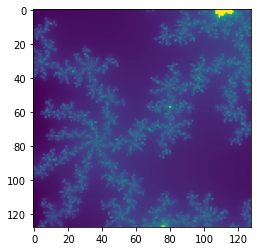

rb: 1170
Loss =  0.4001975655555725
Loss =  0.46126753091812134
Loss =  0.42941194772720337
Loss =  0.4163971543312073
Loss =  0.4228112995624542
Loss =  0.37303030490875244
Loss =  0.43482720851898193
Loss =  0.4132554829120636
Loss =  0.41996505856513977
Loss =  0.3607173562049866
Loss =  0.4109380841255188
Loss =  0.47551658749580383
Loss =  0.43389081954956055
Loss =  0.40551677346229553
Loss =  0.4081987142562866
Loss =  0.4441414177417755
Loss =  0.41320717334747314
Loss =  0.4448966383934021
Loss =  0.3958098888397217
Loss =  0.3972622752189636
Loss =  0.47237712144851685
Loss =  0.4578036069869995
Loss =  0.48299577832221985
Loss =  0.4407459795475006
Loss =  0.38820207118988037
Loss =  0.44762468338012695
Loss =  0.4398905038833618
Loss =  0.44696635007858276
Loss =  0.38459405303001404
Loss =  0.4831700921058655
Loss =  0.4080347418785095
Loss =  0.4547635316848755
Loss =  0.3946465849876404
Loss =  0.3563036322593689
Loss =  0.35064804553985596
Loss =  0.45894160866737366
Lo

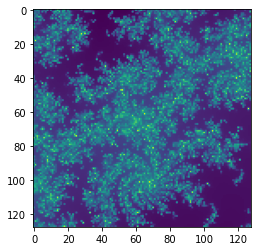

rb: 1370
Loss =  0.38793808221817017
Loss =  0.36945515871047974
Loss =  0.388701856136322
Loss =  0.41571044921875
Loss =  0.3437044024467468
Loss =  0.3783217668533325
Loss =  0.37455400824546814
Loss =  0.39286768436431885
Loss =  0.4289283752441406
Loss =  0.4445423185825348
Loss =  0.3871658146381378
Loss =  0.4747174382209778
Loss =  0.35997068881988525
Loss =  0.39430534839630127
Loss =  0.37698009610176086
Loss =  0.3582785725593567
Loss =  0.38830482959747314
Loss =  0.40506231784820557
Loss =  0.3970909118652344
Loss =  0.37069082260131836
Loss =  0.4312249422073364
Loss =  0.4530986547470093
Loss =  0.44477102160453796
Loss =  0.38385170698165894
Loss =  0.36909550428390503
Loss =  0.40448325872421265
Loss =  0.32213127613067627
Loss =  0.4357888698577881
Loss =  0.390403151512146
Loss =  0.3607550263404846
Loss =  0.4133113622665405
Loss =  0.338601291179657
Loss =  0.4134943187236786
Loss =  0.3463496267795563
Loss =  0.45603251457214355
Loss =  0.440862774848938
Loss =  0

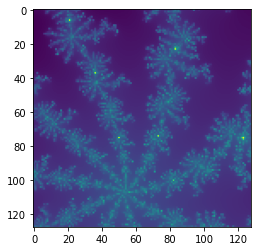

rb: 1570
Loss =  0.4039287567138672
Loss =  0.3701334595680237
Loss =  0.3919786810874939
Loss =  0.38972795009613037
Loss =  0.35500192642211914
Loss =  0.40634629130363464
Loss =  0.4248100519180298
Loss =  0.39893898367881775
Loss =  0.4130099415779114
Loss =  0.33741495013237
Loss =  0.3801955580711365
Loss =  0.370293527841568
Loss =  0.4156361222267151
Loss =  0.4176347255706787
Loss =  0.35552850365638733
Loss =  0.35240137577056885
Loss =  0.356560081243515
Loss =  0.4212839603424072
Loss =  0.3678668439388275
Loss =  0.35332342982292175
Loss =  0.38653263449668884
Loss =  0.392067551612854
Loss =  0.4414903521537781
Loss =  0.3806934952735901
Loss =  0.3361196219921112
Loss =  0.3701053261756897
Loss =  0.3698515295982361
Loss =  0.44859084486961365
Loss =  0.38602781295776367
Loss =  0.4002986550331116
Loss =  0.3841053247451782
Loss =  0.37697023153305054
Loss =  0.40709251165390015
Loss =  0.41314226388931274
Loss =  0.42085403203964233
Loss =  0.429912805557251
Loss =  0.4

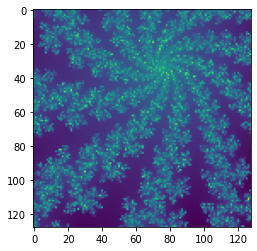

rb: 1770
Loss =  0.3695620894432068
Loss =  0.346655935049057
Loss =  0.4333672523498535
Loss =  0.3764006793498993
Loss =  0.40507572889328003
Loss =  0.3360673487186432
Loss =  0.383698046207428
Loss =  0.34237003326416016
Loss =  0.41484612226486206
Loss =  0.38266801834106445
Loss =  0.3731587529182434
Loss =  0.4086006283760071
Loss =  0.41407835483551025
Loss =  0.4194756746292114
Loss =  0.4178778827190399
Loss =  0.4353063106536865
Loss =  0.40584665536880493
Loss =  0.3962016999721527
Loss =  0.38505202531814575
Loss =  0.4065759778022766
Loss =  0.410230815410614
Loss =  0.37837910652160645
Loss =  0.44454747438430786
Loss =  0.3909091651439667
Loss =  0.3302902579307556
Loss =  0.44911742210388184
Loss =  0.36018553376197815
Loss =  0.38473549485206604
Loss =  0.35668110847473145
Loss =  0.3993998169898987
Loss =  0.3301432728767395
Loss =  0.33992210030555725
Loss =  0.3522675633430481
Loss =  0.40670084953308105
Loss =  0.4243386685848236
Loss =  0.4074597954750061
Loss = 

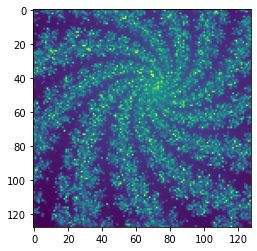

rb: 1970
Loss =  0.3801032304763794
Loss =  0.3459962010383606
Loss =  0.34413135051727295
Loss =  0.3749455511569977
Loss =  0.4100548028945923
Loss =  0.43797534704208374
Loss =  0.3757084310054779
Loss =  0.40838226675987244
Loss =  0.41135913133621216
Loss =  0.36941930651664734
Loss =  0.4296055734157562
Loss =  0.37839585542678833
Loss =  0.3876456618309021
Loss =  0.36304163932800293
Loss =  0.32392191886901855
Loss =  0.3853698968887329
Loss =  0.3813430666923523
Loss =  0.3520837426185608
Loss =  0.3625778555870056
Loss =  0.33194226026535034
Loss =  0.4504748582839966
Loss =  0.38074931502342224
Loss =  0.39769428968429565
Loss =  0.3357933461666107
Loss =  0.37855833768844604
Loss =  0.3767102062702179
Loss =  0.42055046558380127
Loss =  0.44120144844055176
Loss =  0.41137439012527466
Loss =  0.4251515567302704
Loss =  0.37488073110580444
Loss =  0.39755016565322876
Loss =  0.42746055126190186
Loss =  0.3987453877925873
Loss =  0.4395381808280945
Loss =  0.4057154655456543
L

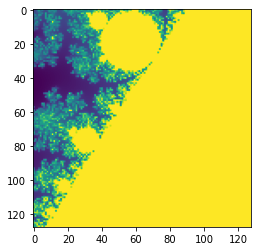

rb: 2170
Loss =  0.404410183429718
Loss =  0.41273558139801025
Loss =  0.3402944803237915
Loss =  0.38407400250434875
Loss =  0.3309958875179291
Loss =  0.34386035799980164
Loss =  0.40549299120903015
Loss =  0.3549971878528595
Loss =  0.3191846013069153
Loss =  0.3867061138153076
Loss =  0.34173792600631714
Loss =  0.36244165897369385
Loss =  0.34617769718170166
Loss =  0.3577588200569153
Loss =  0.34773606061935425
Loss =  0.3654156029224396
Loss =  0.369334876537323
Loss =  0.34481269121170044
Loss =  0.4298921823501587
Loss =  0.36447709798812866
Loss =  0.34684646129608154
Loss =  0.36327064037323
Loss =  0.33723050355911255
Loss =  0.35310184955596924
Loss =  0.39055579900741577
Loss =  0.3814973831176758
Loss =  0.38016581535339355
Loss =  0.35442522168159485
Loss =  0.38152843713760376
Loss =  0.36946630477905273
Loss =  0.39813894033432007
Loss =  0.351093053817749
Loss =  0.34659627079963684
Loss =  0.32696279883384705
Loss =  0.3295668959617615
Loss =  0.380200058221817
Loss

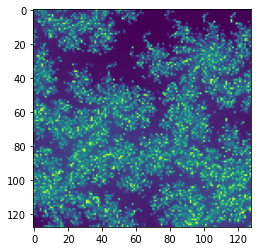

rb: 2370
Loss =  0.4405832290649414
Loss =  0.4048651456832886
Loss =  0.4834445118904114
Loss =  0.3771268427371979
Loss =  0.3983941674232483
Loss =  0.46313127875328064
Loss =  0.43674665689468384
Loss =  0.39108148217201233
Loss =  0.4165039658546448
Loss =  0.42766791582107544
Loss =  0.3933412730693817
Loss =  0.42885977029800415
Loss =  0.4158567190170288
Loss =  0.34895098209381104
Loss =  0.40219059586524963
Loss =  0.4254683554172516
Loss =  0.4429934620857239
Loss =  0.43730801343917847
Loss =  0.4036295413970947
Loss =  0.44777220487594604
Loss =  0.3802814781665802
Loss =  0.4332723617553711
Loss =  0.36811184883117676
Loss =  0.4302014708518982
Loss =  0.3566092848777771
Loss =  0.3782702386379242
Loss =  0.3984440565109253
Loss =  0.4022882580757141
Loss =  0.41741323471069336
Loss =  0.45192551612854004
Loss =  0.37969523668289185
Loss =  0.46648168563842773
Loss =  0.40224695205688477
Loss =  0.48725074529647827
Loss =  0.3893347382545471
Loss =  0.48879289627075195
Lo

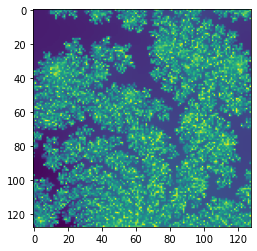

rb: 2570
Loss =  0.44761043787002563
Loss =  0.42109525203704834
Loss =  0.42988547682762146
Loss =  0.4005480408668518
Loss =  0.4150196313858032
Loss =  0.4168972074985504
Loss =  0.4194243848323822
Loss =  0.4799514710903168
Loss =  0.47774699330329895
Loss =  0.4283459186553955
Loss =  0.42293328046798706
Loss =  0.3969804048538208
Loss =  0.4408268630504608
Loss =  0.4610104262828827
Loss =  0.473868727684021
Loss =  0.4282687306404114
Loss =  0.47524914145469666
Loss =  0.42910316586494446
Loss =  0.43163755536079407
Loss =  0.39109688997268677
Loss =  0.4219202995300293
Loss =  0.41850125789642334
Loss =  0.4840088486671448
Loss =  0.40961647033691406
Loss =  0.4559704661369324
Loss =  0.4517461657524109
Loss =  0.4762306809425354
Loss =  0.45461076498031616
Loss =  0.46053916215896606
Loss =  0.42044779658317566
Loss =  0.4567188024520874
Loss =  0.41520243883132935
Loss =  0.42797932028770447
Loss =  0.397519588470459
Loss =  0.416672945022583
Loss =  0.4137110710144043
Loss =

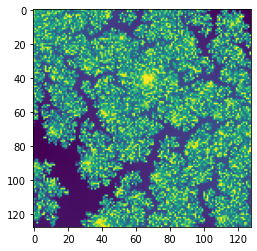

rb: 2770
Loss =  0.4379221200942993
Loss =  0.5042312145233154
Loss =  0.4702470898628235
Loss =  0.5077810287475586
Loss =  0.4650355577468872
Loss =  0.4638509452342987
Loss =  0.5141547918319702
Loss =  0.4277656078338623
Loss =  0.4444441497325897
Loss =  0.4700659513473511
Loss =  0.5203259587287903
Loss =  0.4316732883453369
Loss =  0.40384870767593384
Loss =  0.4551040530204773
Loss =  0.460068941116333
Loss =  0.49743297696113586
Loss =  0.48307979106903076
Loss =  0.48435091972351074
Loss =  0.4970838129520416
Loss =  0.4638911485671997
Loss =  0.4366869032382965
Loss =  0.4552348852157593
Loss =  0.4557584524154663
Loss =  0.4669860005378723
Loss =  0.4549141824245453
Loss =  0.48676514625549316
Loss =  0.5137724280357361
Loss =  0.37834274768829346
Loss =  0.4381043612957001
Loss =  0.5140162110328674
Loss =  0.47963404655456543
Loss =  0.42371976375579834
Loss =  0.4644666910171509
Loss =  0.45773792266845703
Loss =  0.40475377440452576
Loss =  0.45027369260787964
Loss =  0

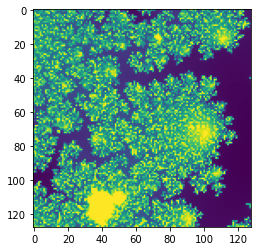

rb: 2970
Loss =  0.4939311742782593
Loss =  0.46251845359802246
Loss =  0.47363531589508057
Loss =  0.506867527961731
Loss =  0.46900227665901184
Loss =  0.4352613091468811
Loss =  0.4608631432056427
Loss =  0.48376673460006714
Loss =  0.4737759828567505
Loss =  0.44410908222198486
Loss =  0.4854077100753784
Loss =  0.4808730483055115
Loss =  0.44037380814552307
Loss =  0.45541852712631226
Loss =  0.47962188720703125
Loss =  0.4196394383907318
Loss =  0.4481186866760254
Loss =  0.5101640224456787
Loss =  0.4606761038303375
Loss =  0.41325896978378296
Loss =  0.5112147331237793
Loss =  0.46757644414901733
Loss =  0.5069156289100647
Loss =  0.48418813943862915
Loss =  0.46625107526779175
Loss =  0.44685736298561096
Loss =  0.4568726420402527
Loss =  0.4718749523162842
Loss =  0.4318242073059082
Loss =  0.4282527267932892
Loss =  0.4589114785194397
Loss =  0.42585480213165283
Loss =  0.44745802879333496
Loss =  0.45762893557548523
Loss =  0.4252742826938629
Loss =  0.43028178811073303
Los

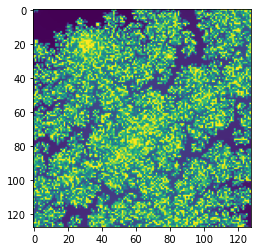

rb: 3170
Loss =  0.44092607498168945
Loss =  0.5067418813705444
Loss =  0.47560760378837585
Loss =  0.5023137927055359
Loss =  0.39797043800354004
Loss =  0.48984503746032715
Loss =  0.44571760296821594
Loss =  0.46039313077926636
Loss =  0.3767924904823303
Loss =  0.4342847466468811
Loss =  0.4994029402732849
Loss =  0.43955251574516296
Loss =  0.47524112462997437
Loss =  0.463314950466156
Loss =  0.5112004280090332
Loss =  0.44636672735214233
Loss =  0.4249974191188812
Loss =  0.4724826216697693
Loss =  0.47182497382164
Loss =  0.455119788646698
Loss =  0.41437146067619324
Loss =  0.3454861640930176
Loss =  0.510858416557312
Loss =  0.4797016382217407
Loss =  0.44209179282188416
Loss =  0.4149066209793091
Loss =  0.48772111535072327
Loss =  0.4813348650932312
Loss =  0.4476207494735718
Loss =  0.4293208122253418
Loss =  0.49714910984039307
Loss =  0.48344364762306213
Loss =  0.38808077573776245
Loss =  0.41851967573165894
Loss =  0.4839808940887451
Loss =  0.418903648853302
Loss =  0

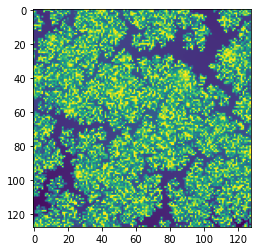

rb: 3370
Loss =  0.4826310873031616
Loss =  0.502315878868103
Loss =  0.435987651348114
Loss =  0.4363253116607666
Loss =  0.5188501477241516
Loss =  0.48540234565734863
Loss =  0.4765865206718445
Loss =  0.4841516613960266
Loss =  0.5055679082870483
Loss =  0.40304112434387207
Loss =  0.4773356318473816
Loss =  0.4623538553714752
Loss =  0.4708717465400696
Loss =  0.5224393606185913
Loss =  0.5193836688995361
Loss =  0.48046576976776123
Loss =  0.42263686656951904
Loss =  0.39900946617126465
Loss =  0.48409783840179443
Loss =  0.49217578768730164
Loss =  0.4744400382041931
Loss =  0.4874674677848816
Loss =  0.5105549097061157
Loss =  0.5306991338729858
Loss =  0.47290343046188354
Loss =  0.41618242859840393
Loss =  0.47932276129722595
Loss =  0.4669857621192932
Loss =  0.42758822441101074
Loss =  0.4430975317955017
Loss =  0.4525179862976074
Loss =  0.44768497347831726
Loss =  0.47063547372817993
Loss =  0.40286341309547424
Loss =  0.38512933254241943
Loss =  0.4973106384277344
Loss =

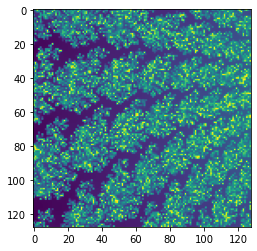

rb: 3570
Loss =  0.4773528277873993
Loss =  0.49890056252479553
Loss =  0.4794444143772125
Loss =  0.4612386226654053
Loss =  0.41248366236686707
Loss =  0.459286093711853
Loss =  0.4865783452987671
Loss =  0.5005767941474915
Loss =  0.4279695749282837
Loss =  0.4734566807746887
Loss =  0.5029057264328003
Loss =  0.4561917185783386
Loss =  0.47368335723876953
Loss =  0.47309190034866333
Loss =  0.44346052408218384
Loss =  0.4878026247024536
Loss =  0.4907582700252533
Loss =  0.41937732696533203
Loss =  0.46712613105773926
Loss =  0.4834911823272705
Loss =  0.4682331681251526
Loss =  0.4387921690940857
Loss =  0.4616501033306122
Loss =  0.46017220616340637
Loss =  0.39098310470581055
Loss =  0.4369966387748718
Loss =  0.46576541662216187
Loss =  0.4143054485321045
Loss =  0.49592864513397217
Loss =  0.37169063091278076
Loss =  0.4616034924983978
Loss =  0.44509315490722656
Loss =  0.4252333641052246
Loss =  0.39637744426727295
Loss =  0.4242214858531952
Loss =  0.4952792525291443
Loss =

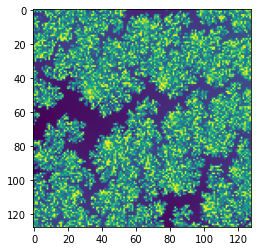

rb: 3770
Loss =  0.4431033730506897
Loss =  0.5002173185348511
Loss =  0.5615899562835693
Loss =  0.4881657063961029
Loss =  0.45772799849510193
Loss =  0.46060219407081604
Loss =  0.5056945085525513
Loss =  0.45305246114730835
Loss =  0.47596126794815063
Loss =  0.4813464283943176
Loss =  0.4977048635482788
Loss =  0.4949415624141693
Loss =  0.4792540669441223
Loss =  0.4599645137786865
Loss =  0.4574835002422333
Loss =  0.4790046811103821
Loss =  0.47652101516723633
Loss =  0.3799437880516052
Loss =  0.5067524909973145
Loss =  0.5175172090530396
Loss =  0.4519738554954529
Loss =  0.4937313199043274
Loss =  0.46457618474960327
Loss =  0.4831838011741638
Loss =  0.503180980682373
Loss =  0.4059385359287262
Loss =  0.42168742418289185
Loss =  0.4844672679901123
Loss =  0.4610288739204407
Loss =  0.500113308429718
Loss =  0.47209662199020386
Loss =  0.5099011063575745
Loss =  0.4710541367530823
Loss =  0.490714430809021
Loss =  0.4825255870819092
Loss =  0.5383992791175842
Loss =  0.4942

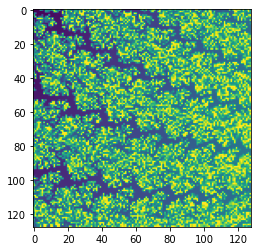

rb: 3970
Loss =  0.41385960578918457
Loss =  0.42891770601272583
Loss =  0.5042405128479004
Loss =  0.438942551612854
Loss =  0.4033694565296173
Loss =  0.4640171229839325
Loss =  0.48281705379486084
Loss =  0.464412659406662
Loss =  0.428409218788147
Loss =  0.41473597288131714
Loss =  0.44909945130348206
Loss =  0.5002596378326416
Loss =  0.39413726329803467
Loss =  0.49141407012939453
Loss =  0.4675999879837036
Loss =  0.47182661294937134
Loss =  0.44097471237182617
Loss =  0.46061021089553833
Loss =  0.4626830220222473
Loss =  0.5150318145751953
Loss =  0.45131587982177734
Loss =  0.5112571716308594
Loss =  0.5095188021659851
Loss =  0.4680420756340027
Loss =  0.47865283489227295
Loss =  0.4253528416156769
Loss =  0.4575231671333313
Loss =  0.4682380259037018
Loss =  0.4934433698654175
Loss =  0.4286358952522278
Loss =  0.4586471915245056
Loss =  0.49090343713760376
Loss =  0.4212476909160614
Loss =  0.4599606394767761
Loss =  0.5045281648635864
Loss =  0.43657857179641724
Loss =  

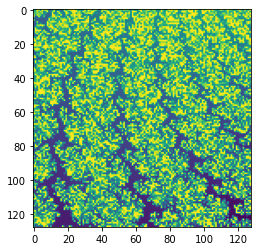

rb: 4170
Loss =  0.5181763768196106
Loss =  0.48677313327789307
Loss =  0.4944934844970703
Loss =  0.5124157667160034
Loss =  0.49000057578086853
Loss =  0.5079336166381836
Loss =  0.5234585404396057
Loss =  0.480430543422699
Loss =  0.4270199239253998
Loss =  0.4718530774116516
Loss =  0.48482850193977356
Loss =  0.47036486864089966
Loss =  0.44269269704818726
Loss =  0.5149317979812622
Loss =  0.4813780188560486
Loss =  0.5106581449508667
Loss =  0.46156230568885803
Loss =  0.5704491138458252
Loss =  0.46462956070899963
Loss =  0.5132706165313721
Loss =  0.5065983533859253
Loss =  0.4999859929084778
Loss =  0.5283559560775757
Loss =  0.4744241535663605
Loss =  0.4985555112361908
Loss =  0.5083280801773071
Loss =  0.483445942401886
Loss =  0.4646316170692444
Loss =  0.4734090268611908
Loss =  0.505743145942688
Loss =  0.46838003396987915
Loss =  0.48810911178588867
Loss =  0.4965283274650574
Loss =  0.4640839695930481
Loss =  0.5103690028190613
Loss =  0.5044814348220825
Loss =  0.490

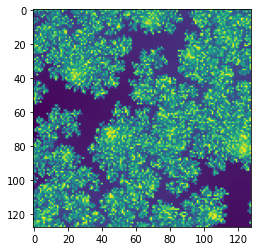

rb: 4370
Loss =  0.4699995517730713
Loss =  0.4938170909881592
Loss =  0.44694089889526367
Loss =  0.4521239101886749
Loss =  0.4589774012565613
Loss =  0.45309412479400635
Loss =  0.42613309621810913
Loss =  0.4871317744255066
Loss =  0.42630377411842346
Loss =  0.498346745967865
Loss =  0.4258500635623932
Loss =  0.45032283663749695
Loss =  0.4886682629585266
Loss =  0.48302188515663147
Loss =  0.471185564994812
Loss =  0.4673961400985718
Loss =  0.4480794072151184
Loss =  0.44234344363212585
Loss =  0.4867129623889923
Loss =  0.4206749200820923
Loss =  0.4454503655433655
Loss =  0.5113155245780945
Loss =  0.4830196797847748
Loss =  0.45324987173080444
Loss =  0.4279918074607849
Loss =  0.3919053077697754
Loss =  0.44770610332489014
Loss =  0.4576815366744995
Loss =  0.41439253091812134
Loss =  0.5038343667984009
Loss =  0.4941093325614929
Loss =  0.47152209281921387
Loss =  0.4276033639907837
Loss =  0.45479118824005127
Loss =  0.4581855535507202
Loss =  0.47610142827033997
Loss =  

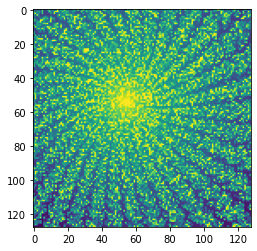

rb: 4570
Loss =  0.49712520837783813
Loss =  0.5239487886428833
Loss =  0.49366840720176697
Loss =  0.42430222034454346
Loss =  0.42109954357147217
Loss =  0.5311785936355591
Loss =  0.5072099566459656
Loss =  0.4721994698047638
Loss =  0.4919684827327728
Loss =  0.45735377073287964
Loss =  0.42643773555755615
Loss =  0.4268980026245117
Loss =  0.49411407113075256
Loss =  0.4516003727912903
Loss =  0.48445600271224976
Loss =  0.5003557801246643
Loss =  0.4546162486076355
Loss =  0.46062642335891724
Loss =  0.44903987646102905
Loss =  0.47400397062301636
Loss =  0.4415383040904999
Loss =  0.49554839730262756
Loss =  0.4365141689777374
Loss =  0.4722093939781189
Loss =  0.4545578360557556
Loss =  0.42368078231811523
Loss =  0.46186113357543945
Loss =  0.4355924129486084
Loss =  0.4645531475543976
Loss =  0.4380471110343933
Loss =  0.38039159774780273
Loss =  0.4654868543148041
Loss =  0.4428403675556183
Loss =  0.41627007722854614
Loss =  0.4604812562465668
Loss =  0.4696654975414276
Los

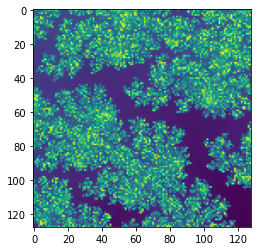

rb: 4770
Loss =  0.45062392950057983
Loss =  0.5036506652832031
Loss =  0.4797877073287964
Loss =  0.4623383581638336
Loss =  0.4929518699645996
Loss =  0.486286461353302
Loss =  0.5130268335342407
Loss =  0.4831506609916687
Loss =  0.48438888788223267
Loss =  0.3887539803981781
Loss =  0.4486130177974701
Loss =  0.45559728145599365
Loss =  0.5255564451217651
Loss =  0.49613872170448303
Loss =  0.5189631581306458
Loss =  0.48383522033691406
Loss =  0.4907991588115692
Loss =  0.47664135694503784
Loss =  0.4547071158885956
Loss =  0.4084336757659912
Loss =  0.46697694063186646
Loss =  0.4985465705394745
Loss =  0.5364189743995667
Loss =  0.4346931576728821
Loss =  0.46372854709625244
Loss =  0.44407591223716736
Loss =  0.4875853657722473
Loss =  0.44405651092529297
Loss =  0.47754937410354614
Loss =  0.46505171060562134
Loss =  0.5287368297576904
Loss =  0.47807252407073975
Loss =  0.40556222200393677
Loss =  0.537298321723938
Loss =  0.5020509362220764
Loss =  0.4393414258956909
Loss = 

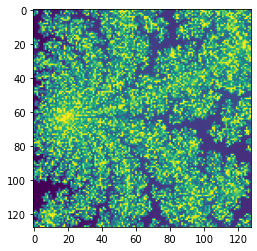

rb: 4970
Loss =  0.5352815985679626
Loss =  0.4938100278377533
Loss =  0.4801250100135803
Loss =  0.4630148410797119
Loss =  0.4708443284034729
Loss =  0.4607222378253937
Loss =  0.3879660964012146
Loss =  0.47291067242622375
Loss =  0.39238816499710083
Loss =  0.5174070596694946
Loss =  0.4662410616874695
Loss =  0.3788790702819824
Loss =  0.444629967212677
Loss =  0.5216715335845947
Loss =  0.5103511810302734
Loss =  0.46475687623023987
Loss =  0.42315661907196045
Loss =  0.4463844895362854
Loss =  0.4489779770374298
Loss =  0.3873838782310486
Loss =  0.4583951532840729
Loss =  0.45426610112190247
Loss =  0.4791761636734009
Loss =  0.40092986822128296
Loss =  0.43590492010116577
Loss =  0.438314288854599
Loss =  0.4694123864173889
Loss =  0.45855557918548584
Loss =  0.4476085305213928
Loss =  0.46825993061065674
Loss =  0.4154490828514099
Loss =  0.49629828333854675
Loss =  0.5006990432739258
Loss =  0.40881848335266113
Loss =  0.4558379054069519
Loss =  0.4493529796600342
Loss =  0.

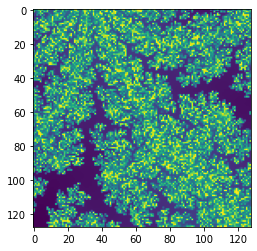

rb: 5170
Loss =  0.4758549928665161
Loss =  0.4751794636249542
Loss =  0.4413038492202759
Loss =  0.47451362013816833
Loss =  0.49434894323349
Loss =  0.3914414346218109
Loss =  0.39998286962509155
Loss =  0.45724108815193176
Loss =  0.44494712352752686
Loss =  0.4551609754562378
Loss =  0.4747364819049835
Loss =  0.4432726502418518
Loss =  0.40172630548477173
Loss =  0.4059441089630127
Loss =  0.41774362325668335
Loss =  0.4355400800704956
Loss =  0.47502827644348145
Loss =  0.44929659366607666
Loss =  0.4195135235786438
Loss =  0.3989922106266022
Loss =  0.4552062451839447
Loss =  0.4496905207633972
Loss =  0.4672348201274872
Loss =  0.4166862964630127
Loss =  0.48374253511428833
Loss =  0.4656633734703064
Loss =  0.46167004108428955
Loss =  0.44836968183517456
Loss =  0.436746209859848
Loss =  0.4329560697078705
Loss =  0.42902085185050964
Loss =  0.3796687424182892
Loss =  0.45378655195236206
Loss =  0.3947408199310303
Loss =  0.47896063327789307
Loss =  0.37964269518852234
Loss = 

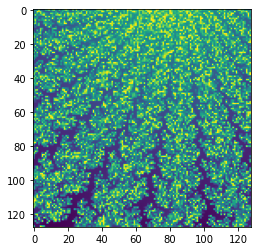

rb: 5370
Loss =  0.4765660762786865
Loss =  0.5202804803848267
Loss =  0.4333275556564331
Loss =  0.48346495628356934
Loss =  0.47626417875289917
Loss =  0.4659416079521179
Loss =  0.4996127486228943
Loss =  0.5127074718475342
Loss =  0.48666149377822876
Loss =  0.5175635814666748
Loss =  0.49655765295028687
Loss =  0.45547711849212646
Loss =  0.4992585778236389
Loss =  0.44135433435440063
Loss =  0.4859904646873474
Loss =  0.4581999182701111
Loss =  0.5129556059837341
Loss =  0.4874376654624939
Loss =  0.5522526502609253
Loss =  0.4544234275817871
Loss =  0.4809538722038269
Loss =  0.4594581723213196
Loss =  0.49772152304649353
Loss =  0.49221891164779663
Loss =  0.45309072732925415
Loss =  0.5308088064193726
Loss =  0.49317875504493713
Loss =  0.4524528980255127
Loss =  0.49502864480018616
Loss =  0.4610752463340759
Loss =  0.47372105717658997
Loss =  0.4534710645675659
Loss =  0.4490712881088257
Loss =  0.46980804204940796
Loss =  0.5258492231369019
Loss =  0.47838476300239563
Loss 

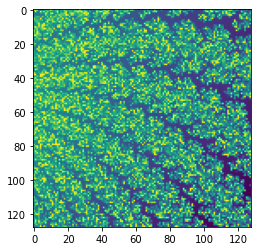

rb: 5570
Loss =  0.4497627019882202
Loss =  0.5134247541427612
Loss =  0.453474223613739
Loss =  0.4668428599834442
Loss =  0.47943925857543945
Loss =  0.4737005829811096
Loss =  0.5184320211410522
Loss =  0.5152711868286133
Loss =  0.48726415634155273
Loss =  0.5306299328804016
Loss =  0.4607851505279541
Loss =  0.5123493671417236
Loss =  0.5037961006164551
Loss =  0.47588539123535156
Loss =  0.4982651472091675
Loss =  0.5151901245117188
Loss =  0.4557381272315979
Loss =  0.5196843147277832
Loss =  0.4727073013782501
Loss =  0.45108795166015625
Loss =  0.4764610528945923
Loss =  0.44740718603134155
Loss =  0.47877809405326843
Loss =  0.4677138328552246
Loss =  0.4966772794723511
Loss =  0.47075581550598145
Loss =  0.5151695013046265
Loss =  0.47668522596359253
Loss =  0.5205240845680237
Loss =  0.49721676111221313
Loss =  0.40650424361228943
Loss =  0.4560137689113617
Loss =  0.5004085302352905
Loss =  0.40654659271240234
Loss =  0.5075751543045044
Loss =  0.48407799005508423
Loss =  

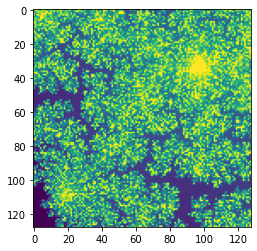

rb: 5770
Loss =  0.5159472823143005
Loss =  0.5119433403015137
Loss =  0.5335952043533325
Loss =  0.5026188492774963
Loss =  0.49676522612571716
Loss =  0.49652159214019775
Loss =  0.505865216255188
Loss =  0.4823884963989258
Loss =  0.4551337957382202
Loss =  0.45190900564193726
Loss =  0.4968261122703552
Loss =  0.4806602895259857
Loss =  0.45263218879699707
Loss =  0.5019071698188782
Loss =  0.535094678401947
Loss =  0.5259631872177124
Loss =  0.45277661085128784
Loss =  0.4548722207546234
Loss =  0.5018900036811829
Loss =  0.46442335844039917
Loss =  0.523144543170929
Loss =  0.4677283465862274
Loss =  0.45044052600860596
Loss =  0.5001081824302673
Loss =  0.489236056804657
Loss =  0.48063865303993225
Loss =  0.4992932081222534
Loss =  0.46656784415245056
Loss =  0.43957260251045227
Loss =  0.40399911999702454
Loss =  0.465532124042511
Loss =  0.4518424868583679
Loss =  0.46879833936691284
Loss =  0.47032976150512695
Loss =  0.46852120757102966
Loss =  0.4785687029361725
Loss =  0.

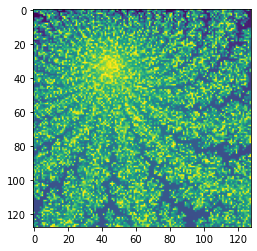

rb: 5970
Loss =  0.5123878717422485
Loss =  0.5087138414382935
Loss =  0.4697801470756531
Loss =  0.427005410194397
Loss =  0.4634934067726135
Loss =  0.441670298576355
Loss =  0.5511709451675415
Loss =  0.502699613571167
Loss =  0.5397424697875977
Loss =  0.48777246475219727
Loss =  0.4623420834541321
Loss =  0.41639459133148193
Loss =  0.47915804386138916
Loss =  0.5231398940086365
Loss =  0.46884989738464355
Loss =  0.5219544172286987
Loss =  0.4487045407295227
Loss =  0.4921310544013977
Loss =  0.5021878480911255
Loss =  0.4726197421550751
Loss =  0.5299670100212097
Loss =  0.47827014327049255
Loss =  0.5327348113059998
Loss =  0.5149974226951599
Loss =  0.46924924850463867
Loss =  0.4397985339164734
Loss =  0.4676174223423004
Loss =  0.42941582202911377
Loss =  0.4449926018714905
Loss =  0.508752703666687
Loss =  0.4632997214794159
Loss =  0.4655735492706299
Loss =  0.4191294312477112
Loss =  0.4904039800167084
Loss =  0.4881557822227478
Loss =  0.4352714419364929
Loss =  0.434630

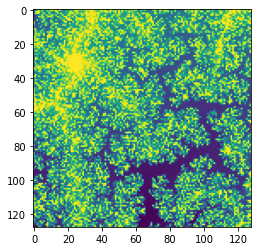

rb: 6170
Loss =  0.5073447823524475
Loss =  0.43888914585113525
Loss =  0.4746450185775757
Loss =  0.4127538204193115
Loss =  0.45251980423927307
Loss =  0.471240758895874
Loss =  0.4888343811035156
Loss =  0.47481590509414673
Loss =  0.48825883865356445
Loss =  0.5044570565223694
Loss =  0.5066269040107727
Loss =  0.4829155206680298
Loss =  0.4447312355041504
Loss =  0.45792698860168457
Loss =  0.4313223958015442
Loss =  0.44804278016090393
Loss =  0.4878982901573181
Loss =  0.4280301630496979
Loss =  0.4991394579410553
Loss =  0.480363667011261
Loss =  0.48309004306793213
Loss =  0.4681181311607361
Loss =  0.4546707272529602
Loss =  0.4642673134803772
Loss =  0.40465182065963745
Loss =  0.498253732919693
Loss =  0.4790034890174866
Loss =  0.5093101263046265
Loss =  0.5068020820617676
Loss =  0.39718097448349
Loss =  0.47043517231941223
Loss =  0.43731728196144104
Loss =  0.4318753778934479
Loss =  0.3966106176376343
Loss =  0.44528135657310486
Loss =  0.4311836063861847
Loss =  0.430

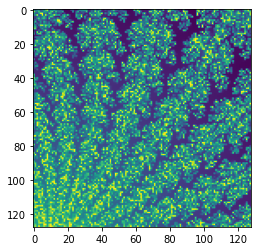

rb: 6370
Loss =  0.44862833619117737
Loss =  0.4288541376590729
Loss =  0.4472912549972534
Loss =  0.4845387935638428
Loss =  0.4734194874763489
Loss =  0.46549707651138306
Loss =  0.47301924228668213
Loss =  0.4782902002334595
Loss =  0.4716247320175171
Loss =  0.46725958585739136
Loss =  0.44309931993484497
Loss =  0.43946048617362976
Loss =  0.4849911332130432
Loss =  0.4778401255607605
Loss =  0.5118343830108643
Loss =  0.4055075943470001
Loss =  0.47167539596557617
Loss =  0.46938520669937134
Loss =  0.5094350576400757
Loss =  0.46670007705688477
Loss =  0.45048123598098755
Loss =  0.44145530462265015
Loss =  0.4790904223918915
Loss =  0.49792441725730896
Loss =  0.4761677086353302
Loss =  0.4805140197277069
Loss =  0.43232202529907227
Loss =  0.4642772674560547
Loss =  0.4481234848499298
Loss =  0.47158849239349365
Loss =  0.42747384309768677
Loss =  0.4653969705104828
Loss =  0.5025283098220825
Loss =  0.4536460041999817
Loss =  0.4536842703819275
Loss =  0.48525023460388184
Los

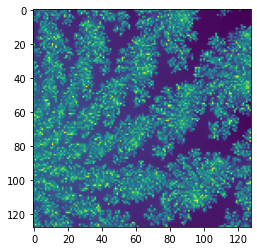

rb: 6570
Loss =  0.476995050907135
Loss =  0.49020469188690186
Loss =  0.4919288456439972
Loss =  0.443059504032135
Loss =  0.4226420819759369
Loss =  0.5112596750259399
Loss =  0.4957980513572693
Loss =  0.49413371086120605
Loss =  0.5137768983840942
Loss =  0.4340207576751709
Loss =  0.4426221251487732
Loss =  0.5371739864349365
Loss =  0.4601289927959442
Loss =  0.4140181243419647
Loss =  0.46044161915779114
Loss =  0.3832961320877075
Loss =  0.4384458065032959
Loss =  0.44861453771591187
Loss =  0.42997628450393677
Loss =  0.46525055170059204
Loss =  0.47047755122184753
Loss =  0.507152795791626
Loss =  0.47672542929649353
Loss =  0.46418702602386475
Loss =  0.4861898422241211
Loss =  0.4575237035751343
Loss =  0.5250439047813416
Loss =  0.4588717520236969
Loss =  0.46367013454437256
Loss =  0.4782845973968506
Loss =  0.44489479064941406
Loss =  0.47825151681900024
Loss =  0.4459479749202728
Loss =  0.41709795594215393
Loss =  0.4650571942329407
Loss =  0.4259389042854309
Loss =  0

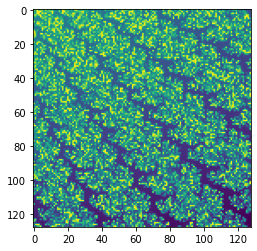

rb: 6770
Loss =  0.45193561911582947
Loss =  0.4320664703845978
Loss =  0.512189507484436
Loss =  0.4519703984260559
Loss =  0.4696112275123596
Loss =  0.425081729888916
Loss =  0.4663281738758087
Loss =  0.45403265953063965
Loss =  0.4715912938117981
Loss =  0.4298803508281708
Loss =  0.4634881615638733
Loss =  0.48299431800842285
Loss =  0.4770648777484894
Loss =  0.45971134305000305
Loss =  0.4769795536994934
Loss =  0.4696008563041687
Loss =  0.46745628118515015
Loss =  0.44713830947875977
Loss =  0.421610951423645
Loss =  0.43661102652549744
Loss =  0.45196932554244995
Loss =  0.46450310945510864
Loss =  0.44824543595314026
Loss =  0.43603965640068054
Loss =  0.4543076753616333
Loss =  0.43621060252189636
Loss =  0.4691053330898285
Loss =  0.4495398998260498
Loss =  0.49103420972824097
Loss =  0.42214468121528625
Loss =  0.3979235291481018
Loss =  0.46216338872909546
Loss =  0.49696385860443115
Loss =  0.5150482654571533
Loss =  0.44705745577812195
Loss =  0.4492036998271942
Loss 

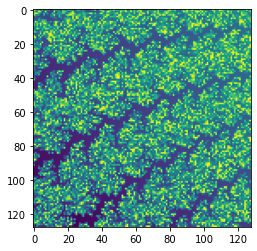

rb: 6970
Loss =  0.4906528890132904
Loss =  0.46398496627807617
Loss =  0.472385972738266
Loss =  0.4799536466598511
Loss =  0.5059619545936584
Loss =  0.43332263827323914
Loss =  0.4939453601837158
Loss =  0.4477466344833374
Loss =  0.4888259172439575
Loss =  0.4515407681465149
Loss =  0.4717729389667511
Loss =  0.46037667989730835
Loss =  0.48115915060043335
Loss =  0.4842068552970886
Loss =  0.49383991956710815
Loss =  0.4792875647544861
Loss =  0.47252213954925537
Loss =  0.4509652256965637
Loss =  0.4528113007545471
Loss =  0.4766518473625183
Loss =  0.42311787605285645
Loss =  0.4802505373954773
Loss =  0.4981642961502075
Loss =  0.4706569314002991
Loss =  0.48988187313079834
Loss =  0.531125545501709
Loss =  0.47961297631263733
Loss =  0.4357496500015259
Loss =  0.44443002343177795
Loss =  0.44193822145462036
Loss =  0.42577052116394043
Loss =  0.5029754638671875
Loss =  0.5045861005783081
Loss =  0.4365106523036957
Loss =  0.5319576859474182
Loss =  0.39461594820022583
Loss =  

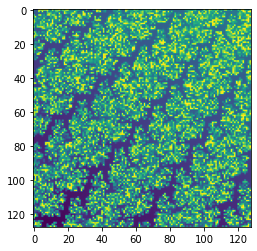

rb: 7170
Loss =  0.42565280199050903
Loss =  0.45155173540115356
Loss =  0.4585261344909668
Loss =  0.4796362519264221
Loss =  0.43849503993988037
Loss =  0.43664127588272095
Loss =  0.44203922152519226
Loss =  0.4231555461883545
Loss =  0.46051225066185
Loss =  0.416170209646225
Loss =  0.42014753818511963
Loss =  0.48053276538848877
Loss =  0.45071810483932495
Loss =  0.4322393536567688
Loss =  0.501969039440155
Loss =  0.47094568610191345
Loss =  0.476205050945282
Loss =  0.4517684876918793
Loss =  0.44576916098594666
Loss =  0.47257810831069946
Loss =  0.4553077220916748
Loss =  0.45994576811790466
Loss =  0.45565497875213623
Loss =  0.4493868947029114
Loss =  0.40360429883003235
Loss =  0.4603894054889679
Loss =  0.4500325918197632
Loss =  0.4710722267627716
Loss =  0.44242343306541443
Loss =  0.4234403073787689
Loss =  0.45524078607559204
Loss =  0.4896547794342041
Loss =  0.4603617787361145
Loss =  0.46954989433288574
Loss =  0.4528583288192749
Loss =  0.37510162591934204
Loss =

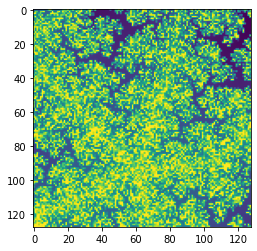

rb: 7370
Loss =  0.479489266872406
Loss =  0.4403892159461975
Loss =  0.5241615176200867
Loss =  0.45886990427970886
Loss =  0.46638381481170654
Loss =  0.4651132822036743
Loss =  0.47031474113464355
Loss =  0.4563557207584381
Loss =  0.45908913016319275
Loss =  0.42682981491088867
Loss =  0.3927110433578491
Loss =  0.4452058672904968
Loss =  0.46510982513427734
Loss =  0.4840335249900818
Loss =  0.4692118167877197
Loss =  0.5073314309120178
Loss =  0.445761114358902
Loss =  0.41357848048210144
Loss =  0.5036219358444214
Loss =  0.46336162090301514
Loss =  0.47428345680236816
Loss =  0.4994036555290222
Loss =  0.465579628944397
Loss =  0.4269903302192688
Loss =  0.4874335527420044
Loss =  0.45727038383483887
Loss =  0.522199273109436
Loss =  0.42120397090911865
Loss =  0.44808727502822876
Loss =  0.45722532272338867
Loss =  0.48522141575813293
Loss =  0.4938686192035675
Loss =  0.44679903984069824
Loss =  0.4147800803184509
Loss =  0.40743425488471985
Loss =  0.4331663250923157
Loss = 

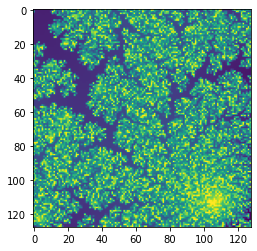

rb: 7570
Loss =  0.5118680000305176
Loss =  0.4488157629966736
Loss =  0.3311353325843811
Loss =  0.44084465503692627
Loss =  0.42926812171936035
Loss =  0.48669785261154175
Loss =  0.42383190989494324
Loss =  0.45924222469329834
Loss =  0.4959130883216858
Loss =  0.42830514907836914
Loss =  0.4358765482902527
Loss =  0.3403659164905548
Loss =  0.4261186718940735
Loss =  0.4023139476776123
Loss =  0.44422802329063416
Loss =  0.38934066891670227
Loss =  0.4444422423839569
Loss =  0.48543649911880493
Loss =  0.41682156920433044
Loss =  0.45924484729766846
Loss =  0.4211750626564026
Loss =  0.44387179613113403
Loss =  0.44767358899116516
Loss =  0.3647781312465668
Loss =  0.3958774209022522
Loss =  0.47601526975631714
Loss =  0.37953251600265503
Loss =  0.4409083425998688
Loss =  0.3475114405155182
Loss =  0.4056026339530945
Loss =  0.4697171449661255
Loss =  0.43764835596084595
Loss =  0.41658252477645874
Loss =  0.46198514103889465
Loss =  0.46397751569747925
Loss =  0.43624770641326904

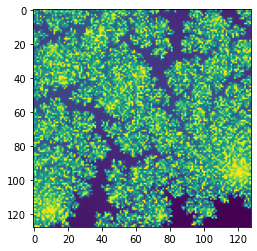

rb: 7770
Loss =  0.49537456035614014
Loss =  0.3866482675075531
Loss =  0.40148910880088806
Loss =  0.3965054154396057
Loss =  0.4054686427116394
Loss =  0.41435229778289795
Loss =  0.4115142524242401
Loss =  0.4702760875225067
Loss =  0.41988492012023926
Loss =  0.38349318504333496
Loss =  0.4327239990234375
Loss =  0.4346641004085541
Loss =  0.37998515367507935
Loss =  0.3681270480155945
Loss =  0.42410558462142944
Loss =  0.4496740698814392
Loss =  0.44290539622306824
Loss =  0.34502851963043213
Loss =  0.41977429389953613
Loss =  0.4239950180053711
Loss =  0.4413779079914093
Loss =  0.3568442463874817
Loss =  0.3511098027229309
Loss =  0.3648357391357422
Loss =  0.40277963876724243
Loss =  0.5167780518531799
Loss =  0.38447803258895874
Loss =  0.4283429980278015
Loss =  0.3949081301689148
Loss =  0.4345022439956665
Loss =  0.37917613983154297
Loss =  0.43215036392211914
Loss =  0.3672253489494324
Loss =  0.36185094714164734
Loss =  0.3399777412414551
Loss =  0.414371132850647
Loss 

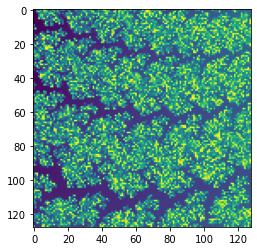

rb: 7970
Loss =  0.48067373037338257
Loss =  0.39100128412246704
Loss =  0.4421563148498535
Loss =  0.3860718011856079
Loss =  0.4205411672592163
Loss =  0.4281269311904907
Loss =  0.40496617555618286
Loss =  0.4739847183227539
Loss =  0.4592881202697754
Loss =  0.4864453971385956
Loss =  0.5236337780952454
Loss =  0.4378310441970825
Loss =  0.401830792427063
Loss =  0.4214492440223694
Loss =  0.4559068977832794
Loss =  0.46027857065200806
Loss =  0.4406184256076813
Loss =  0.4550918638706207
Loss =  0.4465789198875427
Loss =  0.360330730676651
Loss =  0.43173375725746155
Loss =  0.38705530762672424
Loss =  0.4399159848690033
Loss =  0.4554019272327423
Loss =  0.38591960072517395
Loss =  0.4301781952381134
Loss =  0.4161941111087799
Loss =  0.4404621720314026
Loss =  0.4428449273109436
Loss =  0.46180596947669983
Loss =  0.40203264355659485
Loss =  0.4942933917045593
Loss =  0.3588680624961853
Loss =  0.38231828808784485
Loss =  0.436904639005661
Loss =  0.3853389620780945
Loss =  0.44

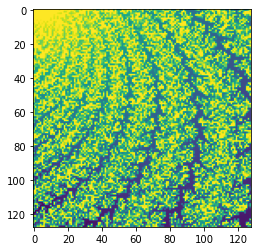

rb: 8170
Loss =  0.4552387595176697
Loss =  0.44279080629348755
Loss =  0.43835195899009705
Loss =  0.4348435699939728
Loss =  0.4859592914581299
Loss =  0.46765077114105225
Loss =  0.4411590099334717
Loss =  0.442493736743927
Loss =  0.49105364084243774
Loss =  0.4343765377998352
Loss =  0.47023022174835205
Loss =  0.4464358389377594
Loss =  0.4673410952091217
Loss =  0.4668033719062805
Loss =  0.36568784713745117
Loss =  0.4614834487438202
Loss =  0.45100873708724976
Loss =  0.47384828329086304
Loss =  0.4877389669418335
Loss =  0.4105560779571533
Loss =  0.42902159690856934
Loss =  0.43099579215049744
Loss =  0.40942034125328064
Loss =  0.4315202236175537
Loss =  0.48074042797088623
Loss =  0.4274601936340332
Loss =  0.43024635314941406
Loss =  0.46580296754837036
Loss =  0.44129377603530884
Loss =  0.41553807258605957
Loss =  0.41259846091270447
Loss =  0.4727475345134735
Loss =  0.41719138622283936
Loss =  0.4418031871318817
Loss =  0.4523341655731201
Loss =  0.41581401228904724
L

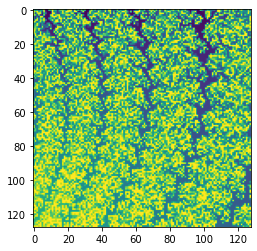

rb: 8370
Loss =  0.4163815379142761
Loss =  0.42894893884658813
Loss =  0.46003392338752747
Loss =  0.4419247508049011
Loss =  0.40356290340423584
Loss =  0.45655620098114014
Loss =  0.4093995690345764
Loss =  0.4683845043182373
Loss =  0.4427025020122528
Loss =  0.4205554723739624
Loss =  0.42559194564819336
Loss =  0.45395177602767944
Loss =  0.4797443151473999
Loss =  0.4598349332809448
Loss =  0.4472518861293793
Loss =  0.4685865044593811
Loss =  0.4008976221084595
Loss =  0.514025092124939
Loss =  0.4387887716293335
Loss =  0.502687394618988
Loss =  0.41773706674575806
Loss =  0.49301913380622864
Loss =  0.4464868903160095
Loss =  0.44609978795051575
Loss =  0.4758192300796509
Loss =  0.4741411805152893
Loss =  0.4359578490257263
Loss =  0.4389111399650574
Loss =  0.4160517156124115
Loss =  0.49450424313545227
Loss =  0.4230039417743683
Loss =  0.43963390588760376
Loss =  0.5007842183113098
Loss =  0.45947474241256714
Loss =  0.43995434045791626
Loss =  0.4956396818161011
Loss =  

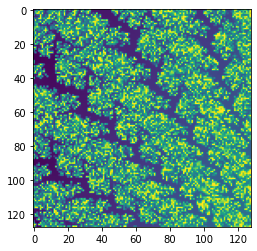

rb: 8570
Loss =  0.44149249792099
Loss =  0.3940485119819641
Loss =  0.45452287793159485
Loss =  0.4326770603656769
Loss =  0.47060632705688477
Loss =  0.4629547595977783
Loss =  0.41756749153137207
Loss =  0.4209139943122864
Loss =  0.4981715977191925
Loss =  0.4534629285335541
Loss =  0.4713878631591797
Loss =  0.45425939559936523
Loss =  0.500165581703186
Loss =  0.4821659326553345
Loss =  0.41081374883651733
Loss =  0.42413997650146484
Loss =  0.46516701579093933
Loss =  0.47334396839141846
Loss =  0.447412371635437
Loss =  0.46662911772727966
Loss =  0.4087640941143036
Loss =  0.45908910036087036
Loss =  0.42037299275398254
Loss =  0.4476351737976074
Loss =  0.4430820643901825
Loss =  0.4057239890098572
Loss =  0.4729383885860443
Loss =  0.5140756964683533
Loss =  0.4316633641719818
Loss =  0.41904523968696594
Loss =  0.5093374252319336
Loss =  0.4683469831943512
Loss =  0.48730483651161194
Loss =  0.4728543758392334
Loss =  0.4314030408859253
Loss =  0.4069766104221344
Loss =  0.

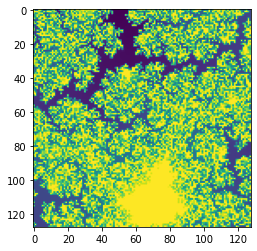

rb: 8770
Loss =  0.4520597755908966
Loss =  0.47279226779937744
Loss =  0.496782124042511
Loss =  0.4599609375
Loss =  0.5167341828346252
Loss =  0.4838141202926636
Loss =  0.4319312572479248
Loss =  0.43633925914764404
Loss =  0.41383349895477295
Loss =  0.4024645984172821
Loss =  0.4469503164291382
Loss =  0.4688141644001007
Loss =  0.49097251892089844
Loss =  0.4657108783721924
Loss =  0.4129972755908966
Loss =  0.4262095093727112
Loss =  0.45558735728263855
Loss =  0.43075326085090637
Loss =  0.44200384616851807
Loss =  0.44392210245132446
Loss =  0.4671032130718231
Loss =  0.4644237756729126
Loss =  0.46603792905807495
Loss =  0.45255178213119507
Loss =  0.45200997591018677
Loss =  0.4539845585823059
Loss =  0.45803213119506836
Loss =  0.4956648051738739
Loss =  0.4547390341758728
Loss =  0.4762483835220337
Loss =  0.4280623495578766
Loss =  0.512077808380127
Loss =  0.45932114124298096
Loss =  0.5020403861999512
Loss =  0.4995006322860718
Loss =  0.4497219920158386
Loss =  0.4348

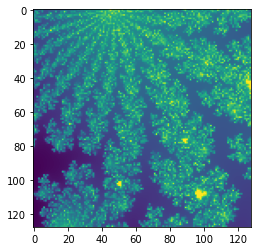

rb: 8970
Loss =  0.4441704750061035
Loss =  0.4462486803531647
Loss =  0.35107362270355225
Loss =  0.4258638620376587
Loss =  0.41442495584487915
Loss =  0.45115578174591064
Loss =  0.4409048557281494
Loss =  0.4247683882713318
Loss =  0.4601304531097412
Loss =  0.38200777769088745
Loss =  0.3758915066719055
Loss =  0.3438114523887634
Loss =  0.4150252342224121
Loss =  0.39537274837493896
Loss =  0.39739370346069336
Loss =  0.44790348410606384
Loss =  0.3987812399864197
Loss =  0.38475221395492554
Loss =  0.446041077375412
Loss =  0.41552984714508057
Loss =  0.36383041739463806
Loss =  0.39887088537216187
Loss =  0.42226406931877136
Loss =  0.4774692952632904
Loss =  0.46314364671707153
Loss =  0.42945826053619385
Loss =  0.4184899926185608
Loss =  0.3999219834804535
Loss =  0.4258263111114502
Loss =  0.395436555147171
Loss =  0.39101290702819824
Loss =  0.4644235074520111
Loss =  0.3727773427963257
Loss =  0.37023380398750305
Loss =  0.37325647473335266
Loss =  0.41205868124961853
Los

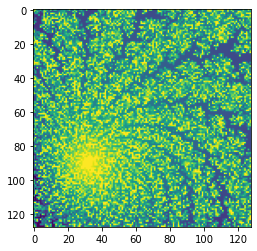

rb: 9170
Loss =  0.39907005429267883
Loss =  0.3882686495780945
Loss =  0.4229416251182556
Loss =  0.4276987910270691
Loss =  0.4175572097301483
Loss =  0.4670768678188324
Loss =  0.4095551073551178
Loss =  0.42364501953125
Loss =  0.38444605469703674
Loss =  0.418978214263916
Loss =  0.39376139640808105
Loss =  0.48542362451553345
Loss =  0.4181646704673767
Loss =  0.3807341754436493
Loss =  0.42044597864151
Loss =  0.41290807723999023
Loss =  0.3596435785293579
Loss =  0.41708651185035706
Loss =  0.4216356873512268
Loss =  0.3728209137916565
Loss =  0.41406625509262085
Loss =  0.42600101232528687
Loss =  0.3550565838813782
Loss =  0.4399462342262268
Loss =  0.40284886956214905
Loss =  0.4356355667114258
Loss =  0.36771851778030396
Loss =  0.38864848017692566
Loss =  0.35244837403297424
Loss =  0.42501580715179443
Loss =  0.41610634326934814
Loss =  0.3643718361854553
Loss =  0.3807973563671112
Loss =  0.3718391954898834
Loss =  0.39281004667282104
Loss =  0.4123338460922241
Loss =  0

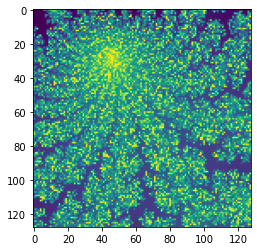

rb: 9370
Loss =  0.41752129793167114
Loss =  0.34149569272994995
Loss =  0.42706239223480225
Loss =  0.3895648419857025
Loss =  0.40988364815711975
Loss =  0.43248245120048523
Loss =  0.3467726707458496
Loss =  0.3786594271659851
Loss =  0.4120463728904724
Loss =  0.466380774974823
Loss =  0.39546525478363037
Loss =  0.48301494121551514
Loss =  0.43228235840797424
Loss =  0.4023555517196655
Loss =  0.3743901252746582
Loss =  0.44131627678871155
Loss =  0.46013200283050537
Loss =  0.41757306456565857
Loss =  0.4072171449661255
Loss =  0.3373257517814636
Loss =  0.35966968536376953
Loss =  0.4199455976486206
Loss =  0.4174503684043884
Loss =  0.43833839893341064
Loss =  0.4341888427734375
Loss =  0.4046090841293335
Loss =  0.4332919716835022
Loss =  0.41150936484336853
Loss =  0.35967254638671875
Loss =  0.4119868278503418
Loss =  0.32954666018486023
Loss =  0.3656143546104431
Loss =  0.40974336862564087
Loss =  0.3795700669288635
Loss =  0.4205167889595032
Loss =  0.41796839237213135
Lo

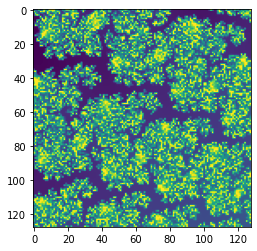

rb: 9570
Loss =  0.43129169940948486
Loss =  0.4003158211708069
Loss =  0.45038318634033203
Loss =  0.41163119673728943
Loss =  0.42810457944869995
Loss =  0.407071053981781
Loss =  0.39592933654785156
Loss =  0.37503480911254883
Loss =  0.4392838180065155
Loss =  0.43546342849731445
Loss =  0.45888426899909973
Loss =  0.38452333211898804
Loss =  0.4614443778991699
Loss =  0.40997347235679626
Loss =  0.4730806350708008
Loss =  0.4058327078819275
Loss =  0.4591476023197174
Loss =  0.4093121886253357
Loss =  0.4128991663455963
Loss =  0.4547796845436096
Loss =  0.4194839596748352
Loss =  0.44079914689064026
Loss =  0.43331092596054077
Loss =  0.39550477266311646
Loss =  0.45289069414138794
Loss =  0.4148009121417999
Loss =  0.43406158685684204
Loss =  0.40818697214126587
Loss =  0.39214369654655457
Loss =  0.45155423879623413
Loss =  0.3990022540092468
Loss =  0.38864389061927795
Loss =  0.39409139752388
Loss =  0.4106925129890442
Loss =  0.3592235743999481
Loss =  0.39451277256011963
Lo

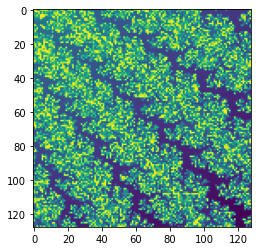

rb: 9770
Loss =  0.4599733352661133
Loss =  0.43184682726860046
Loss =  0.4203101396560669
Loss =  0.4630812406539917
Loss =  0.46346157789230347
Loss =  0.46678805351257324
Loss =  0.47124236822128296
Loss =  0.4164630174636841
Loss =  0.4568901062011719
Loss =  0.4098629057407379
Loss =  0.3999120891094208
Loss =  0.426513135433197
Loss =  0.43342164158821106
Loss =  0.4915248155593872
Loss =  0.4697011113166809
Loss =  0.42734840512275696
Loss =  0.4424113631248474
Loss =  0.39278680086135864
Loss =  0.45945045351982117
Loss =  0.43057769536972046
Loss =  0.42816829681396484
Loss =  0.44917061924934387
Loss =  0.43358802795410156
Loss =  0.46127504110336304
Loss =  0.4467124342918396
Loss =  0.4108597934246063
Loss =  0.4185243248939514
Loss =  0.4003327190876007
Loss =  0.4349251985549927
Loss =  0.43805012106895447
Loss =  0.4405214786529541
Loss =  0.41116708517074585
Loss =  0.3868969678878784
Loss =  0.4529638886451721
Loss =  0.43251800537109375
Loss =  0.39036720991134644
Los

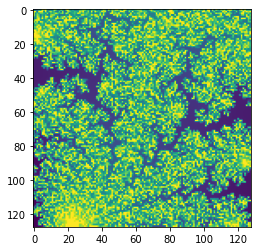

rb: 9970
Loss =  0.40078645944595337
Loss =  0.4195959270000458
Loss =  0.4080171287059784
Loss =  0.40605348348617554
Loss =  0.4068528115749359
Loss =  0.4258386492729187
Loss =  0.4147387444972992
Loss =  0.4346766471862793
Loss =  0.492939829826355
Loss =  0.4513179361820221
Loss =  0.42569708824157715
Loss =  0.43782806396484375
Loss =  0.46324580907821655
Loss =  0.4626833200454712
Loss =  0.3741825819015503
Loss =  0.434175968170166
Loss =  0.42344069480895996
Loss =  0.4365996718406677
Loss =  0.38978615403175354
Loss =  0.4116435647010803
Loss =  0.41708987951278687
Loss =  0.4089401960372925
Loss =  0.41481831669807434
Loss =  0.42282634973526
Loss =  0.3858516216278076
Loss =  0.41816118359565735
Loss =  0.4497092068195343
Loss =  0.38465195894241333
Loss =  0.4848467707633972
Loss =  0.4844035506248474
Loss =  0.44639289379119873
Loss =  0.43106886744499207
Loss =  0.4754940867424011
Loss =  0.413687139749527
Loss =  0.4470585584640503
Loss =  0.4664521813392639
Loss =  0.3

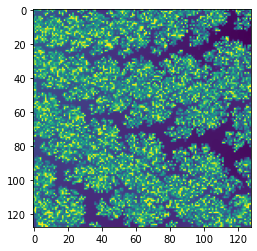

rb: 10170
Loss =  0.3719150424003601
Loss =  0.3436014652252197
Loss =  0.3856433033943176
Loss =  0.37554118037223816
Loss =  0.3196726143360138
Loss =  0.3958069384098053
Loss =  0.3774043023586273
Loss =  0.3018960952758789
Loss =  0.33907443284988403
Loss =  0.4083639085292816
Loss =  0.34157758951187134
Loss =  0.28941503167152405
Loss =  0.34894585609436035
Loss =  0.3578476905822754
Loss =  0.3154933452606201
Loss =  0.36660563945770264
Loss =  0.34625983238220215
Loss =  0.38369619846343994
Loss =  0.3566703200340271
Loss =  0.3876584768295288
Loss =  0.3516940176486969
Loss =  0.30568188428878784
Loss =  0.383543998003006
Loss =  0.39185631275177
Loss =  0.3749963641166687
Loss =  0.3251359462738037
Loss =  0.32286667823791504
Loss =  0.32520243525505066
Loss =  0.3277019262313843
Loss =  0.3278919458389282
Loss =  0.3932206928730011
Loss =  0.3147916793823242
Loss =  0.2903846502304077
Loss =  0.29269522428512573
Loss =  0.40941327810287476
Loss =  0.3430301249027252
Loss =  

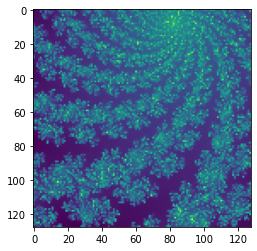

rb: 10370
Loss =  0.40546679496765137
Loss =  0.4301808476448059
Loss =  0.3663181960582733
Loss =  0.3946093022823334
Loss =  0.38177555799484253
Loss =  0.3974371552467346
Loss =  0.46800243854522705
Loss =  0.37659502029418945
Loss =  0.4101164638996124
Loss =  0.4118340313434601
Loss =  0.4066945016384125
Loss =  0.3830776810646057
Loss =  0.42610490322113037
Loss =  0.4121510982513428
Loss =  0.48150232434272766
Loss =  0.3386429250240326
Loss =  0.40097495913505554
Loss =  0.39681774377822876
Loss =  0.3668145537376404
Loss =  0.4306410253047943
Loss =  0.3727908730506897
Loss =  0.4231448173522949
Loss =  0.37716904282569885
Loss =  0.4527320861816406
Loss =  0.4057309031486511
Loss =  0.3737304210662842
Loss =  0.4079722762107849
Loss =  0.3843914270401001
Loss =  0.37331855297088623
Loss =  0.4229753017425537
Loss =  0.4195469319820404
Loss =  0.35383424162864685
Loss =  0.47525256872177124
Loss =  0.3895752429962158
Loss =  0.38574451208114624
Loss =  0.4053047299385071
Loss 

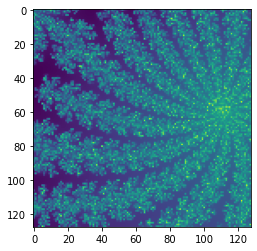

rb: 10570
Loss =  0.4057883024215698
Loss =  0.43118035793304443
Loss =  0.3901914954185486
Loss =  0.4013114869594574
Loss =  0.39034315943717957
Loss =  0.4202200770378113
Loss =  0.41042518615722656
Loss =  0.3816263675689697
Loss =  0.35383960604667664
Loss =  0.39974290132522583
Loss =  0.36362409591674805
Loss =  0.38224440813064575
Loss =  0.36685192584991455
Loss =  0.4133628308773041
Loss =  0.4273042678833008
Loss =  0.36560767889022827
Loss =  0.38457340002059937
Loss =  0.37936651706695557
Loss =  0.40529969334602356
Loss =  0.4127737581729889
Loss =  0.39771777391433716
Loss =  0.4011096954345703
Loss =  0.38418111205101013
Loss =  0.41357892751693726
Loss =  0.4061468839645386
Loss =  0.4375620484352112
Loss =  0.3660311698913574
Loss =  0.3857421875
Loss =  0.40817028284072876
Loss =  0.4152480959892273
Loss =  0.42989158630371094
Loss =  0.36860227584838867
Loss =  0.4065879285335541
Loss =  0.38632041215896606
Loss =  0.43167468905448914
Loss =  0.34506767988204956
Los

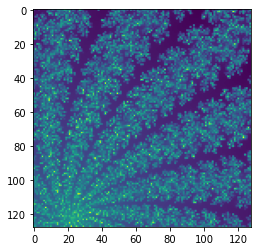

rb: 10770
Loss =  0.45703983306884766
Loss =  0.4662380814552307
Loss =  0.38904082775115967
Loss =  0.416262686252594
Loss =  0.39271825551986694
Loss =  0.43766528367996216
Loss =  0.3904086947441101
Loss =  0.41982483863830566
Loss =  0.3891097605228424
Loss =  0.42373788356781006
Loss =  0.45977750420570374
Loss =  0.38060492277145386
Loss =  0.3735739290714264
Loss =  0.4336504340171814
Loss =  0.37111911177635193
Loss =  0.39166462421417236
Loss =  0.3366878628730774
Loss =  0.4378034472465515
Loss =  0.39082592725753784
Loss =  0.39912211894989014
Loss =  0.3496975898742676
Loss =  0.4075638949871063
Loss =  0.3792833685874939
Loss =  0.3767648935317993
Loss =  0.4418029487133026
Loss =  0.4070107936859131
Loss =  0.42431357502937317
Loss =  0.36320170760154724
Loss =  0.3914487361907959
Loss =  0.41214433312416077
Loss =  0.3473019003868103
Loss =  0.4235277473926544
Loss =  0.38131240010261536
Loss =  0.41539517045021057
Loss =  0.3884626626968384
Loss =  0.40140217542648315
L

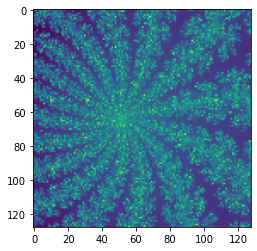

rb: 10970
Loss =  0.3559451997280121
Loss =  0.3504520058631897
Loss =  0.3392065763473511
Loss =  0.46553468704223633
Loss =  0.3841817080974579
Loss =  0.34669771790504456
Loss =  0.3419855237007141
Loss =  0.3350737690925598
Loss =  0.3883981704711914
Loss =  0.40991419553756714
Loss =  0.3587057292461395
Loss =  0.3833695650100708
Loss =  0.33793795108795166
Loss =  0.37110239267349243
Loss =  0.43274539709091187
Loss =  0.40727493166923523
Loss =  0.3938865065574646
Loss =  0.35827991366386414
Loss =  0.3821549415588379
Loss =  0.34902384877204895
Loss =  0.40142369270324707
Loss =  0.39161837100982666
Loss =  0.35671117901802063
Loss =  0.3119097650051117
Loss =  0.33646655082702637
Loss =  0.3907683789730072
Loss =  0.38048702478408813
Loss =  0.3583317697048187
Loss =  0.3792620301246643
Loss =  0.39942270517349243
Loss =  0.4452023506164551
Loss =  0.36568358540534973
Loss =  0.41479557752609253
Loss =  0.3355720043182373
Loss =  0.3828321695327759
Loss =  0.4062901735305786
L

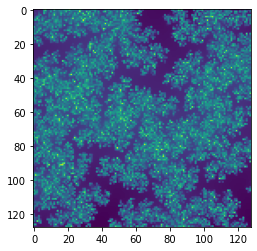

rb: 11170
Loss =  0.3684651851654053
Loss =  0.39811164140701294
Loss =  0.3995707631111145
Loss =  0.3957841992378235
Loss =  0.42910581827163696
Loss =  0.409339040517807
Loss =  0.4391688108444214
Loss =  0.4143196642398834
Loss =  0.4116705060005188
Loss =  0.40778279304504395
Loss =  0.4350425899028778
Loss =  0.4303133487701416
Loss =  0.4255015254020691
Loss =  0.39417406916618347
Loss =  0.39069294929504395
Loss =  0.40333622694015503
Loss =  0.38051170110702515
Loss =  0.4199826121330261
Loss =  0.4384823739528656
Loss =  0.4101342260837555
Loss =  0.458964079618454
Loss =  0.3909720182418823
Loss =  0.4243306517601013
Loss =  0.34826087951660156
Loss =  0.3749412000179291
Loss =  0.415419340133667
Loss =  0.4664357602596283
Loss =  0.3716168999671936
Loss =  0.4507397711277008
Loss =  0.42383071780204773
Loss =  0.40570375323295593
Loss =  0.40486228466033936
Loss =  0.3902382254600525
Loss =  0.3478407561779022
Loss =  0.3581421375274658
Loss =  0.43240872025489807
Loss =  0

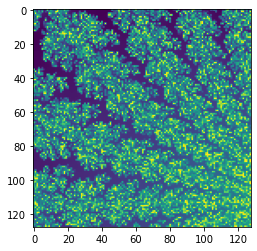

rb: 11370
Loss =  0.37682026624679565
Loss =  0.4279671907424927
Loss =  0.37276095151901245
Loss =  0.3912730813026428
Loss =  0.3173474073410034
Loss =  0.3809816837310791
Loss =  0.42531877756118774
Loss =  0.3920270800590515
Loss =  0.3586330711841583
Loss =  0.4546235501766205
Loss =  0.36834895610809326
Loss =  0.3417789340019226
Loss =  0.41332751512527466
Loss =  0.4395904541015625
Loss =  0.3743082284927368
Loss =  0.3833732008934021
Loss =  0.4164443612098694
Loss =  0.3649449944496155
Loss =  0.351630836725235
Loss =  0.36762508749961853
Loss =  0.3841261863708496
Loss =  0.38999325037002563
Loss =  0.3603184223175049
Loss =  0.31866511702537537
Loss =  0.4164993464946747
Loss =  0.33741727471351624
Loss =  0.4461769163608551
Loss =  0.44153401255607605
Loss =  0.4188992381095886
Loss =  0.3815079927444458
Loss =  0.333615243434906
Loss =  0.38080358505249023
Loss =  0.3470996618270874
Loss =  0.3610456883907318
Loss =  0.40512320399284363
Loss =  0.35852956771850586
Loss = 

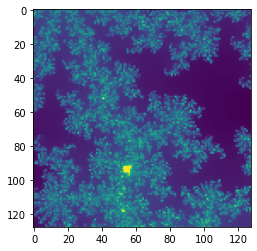

rb: 11570
Loss =  0.40443435311317444
Loss =  0.39677536487579346
Loss =  0.3973042964935303
Loss =  0.408991277217865
Loss =  0.4033809304237366
Loss =  0.3892313241958618
Loss =  0.3526887893676758
Loss =  0.37457308173179626
Loss =  0.4109148383140564
Loss =  0.3880201578140259
Loss =  0.46113264560699463
Loss =  0.3841598331928253
Loss =  0.37377649545669556
Loss =  0.374758780002594
Loss =  0.3782497048377991
Loss =  0.38184279203414917
Loss =  0.3708699345588684
Loss =  0.3658156991004944
Loss =  0.3862842917442322
Loss =  0.4049133062362671
Loss =  0.3859778344631195
Loss =  0.3886479139328003
Loss =  0.42337387800216675
Loss =  0.3433067798614502
Loss =  0.41879016160964966
Loss =  0.3435025215148926
Loss =  0.3814144730567932
Loss =  0.4351460933685303
Loss =  0.41716477274894714
Loss =  0.3716086745262146
Loss =  0.363450288772583
Loss =  0.32302847504615784
Loss =  0.3757752478122711
Loss =  0.34292131662368774
Loss =  0.38801735639572144
Loss =  0.38878530263900757
Loss =  

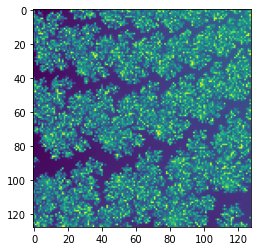

rb: 11770
Loss =  0.3474031090736389
Loss =  0.3602639436721802
Loss =  0.3550511598587036
Loss =  0.39542868733406067
Loss =  0.35949280858039856
Loss =  0.40756016969680786
Loss =  0.4054226577281952
Loss =  0.3366375267505646
Loss =  0.3431966304779053
Loss =  0.37700155377388
Loss =  0.3452361822128296
Loss =  0.3170139193534851
Loss =  0.365581214427948
Loss =  0.38383346796035767
Loss =  0.35786545276641846
Loss =  0.35700738430023193
Loss =  0.32656988501548767
Loss =  0.31138065457344055
Loss =  0.42212367057800293
Loss =  0.34964612126350403
Loss =  0.36938172578811646
Loss =  0.3767646551132202
Loss =  0.3553106188774109
Loss =  0.34897106885910034
Loss =  0.336643785238266
Loss =  0.34895050525665283
Loss =  0.3828403949737549
Loss =  0.3888893127441406
Loss =  0.37646424770355225
Loss =  0.3611529469490051
Loss =  0.3845306932926178
Loss =  0.3162617087364197
Loss =  0.37165600061416626
Loss =  0.4243682026863098
Loss =  0.34411385655403137
Loss =  0.3665350675582886
Loss =

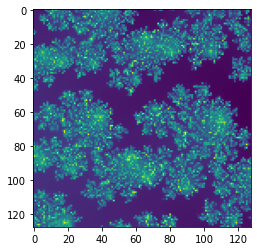

rb: 11970
Loss =  0.3656311333179474
Loss =  0.36401769518852234
Loss =  0.43213433027267456
Loss =  0.30805209279060364
Loss =  0.35158705711364746
Loss =  0.3772727847099304
Loss =  0.26257556676864624
Loss =  0.38236433267593384
Loss =  0.32747912406921387
Loss =  0.3554738163948059
Loss =  0.3181496858596802
Loss =  0.37636837363243103
Loss =  0.3698092997074127
Loss =  0.33743345737457275
Loss =  0.3455944061279297
Loss =  0.364098459482193
Loss =  0.3229835629463196
Loss =  0.27617308497428894
Loss =  0.3550635278224945
Loss =  0.36821824312210083
Loss =  0.3063504695892334
Loss =  0.3246442377567291
Loss =  0.2944467067718506
Loss =  0.34793609380722046
Loss =  0.35550016164779663
Loss =  0.3480287194252014
Loss =  0.2968372404575348
Loss =  0.3332063555717468
Loss =  0.29138973355293274
Loss =  0.3448214530944824
Loss =  0.3778643012046814
Loss =  0.353726327419281
Loss =  0.3211706280708313
Loss =  0.40869107842445374
Loss =  0.36046555638313293
Loss =  0.3158584237098694
Loss

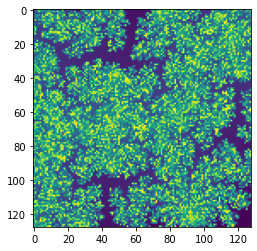

rb: 12170
Loss =  0.397722452878952
Loss =  0.3714596927165985
Loss =  0.40766412019729614
Loss =  0.35240334272384644
Loss =  0.3967403769493103
Loss =  0.3802322745323181
Loss =  0.35968512296676636
Loss =  0.3554449677467346
Loss =  0.38594257831573486
Loss =  0.3286720812320709
Loss =  0.3886914849281311
Loss =  0.341748982667923
Loss =  0.37474432587623596
Loss =  0.3531099855899811
Loss =  0.39235901832580566
Loss =  0.34525245428085327
Loss =  0.36897408962249756
Loss =  0.36358875036239624
Loss =  0.37733229994773865
Loss =  0.33971667289733887
Loss =  0.37094900012016296
Loss =  0.4006933271884918
Loss =  0.3768978416919708
Loss =  0.37161019444465637
Loss =  0.3700979948043823
Loss =  0.3673368990421295
Loss =  0.3651163876056671
Loss =  0.3899555206298828
Loss =  0.3771541714668274
Loss =  0.41347751021385193
Loss =  0.3400779664516449
Loss =  0.3179262578487396
Loss =  0.34707745909690857
Loss =  0.37799638509750366
Loss =  0.3640674650669098
Loss =  0.3819901645183563
Loss

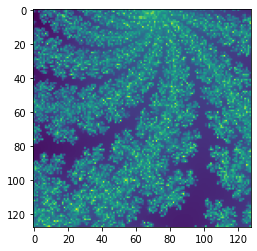

rb: 12370
Loss =  0.44579339027404785
Loss =  0.4290100336074829
Loss =  0.4193872809410095
Loss =  0.42920151352882385
Loss =  0.3816033601760864
Loss =  0.4395792782306671
Loss =  0.39225339889526367
Loss =  0.4815383851528168
Loss =  0.36023491621017456
Loss =  0.4174371361732483
Loss =  0.4150771498680115
Loss =  0.4068700671195984
Loss =  0.4138280749320984
Loss =  0.40888816118240356
Loss =  0.4078308641910553
Loss =  0.4369134306907654
Loss =  0.46857595443725586
Loss =  0.37745076417922974
Loss =  0.38548216223716736
Loss =  0.378570556640625
Loss =  0.41241455078125
Loss =  0.44580233097076416
Loss =  0.42534494400024414
Loss =  0.4551317095756531
Loss =  0.37054914236068726
Loss =  0.46308085322380066
Loss =  0.4019109308719635
Loss =  0.35241377353668213
Loss =  0.38602179288864136
Loss =  0.3874126076698303
Loss =  0.41210177540779114
Loss =  0.46988755464553833
Loss =  0.5073498487472534
Loss =  0.3916429579257965
Loss =  0.36353594064712524
Loss =  0.40778517723083496
Los

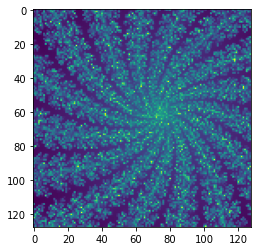

rb: 12570
Loss =  0.3351922035217285
Loss =  0.36588096618652344
Loss =  0.4167279303073883
Loss =  0.3713904023170471
Loss =  0.4243609309196472
Loss =  0.3811163902282715
Loss =  0.35304373502731323
Loss =  0.3262012004852295
Loss =  0.4197022616863251
Loss =  0.44327014684677124
Loss =  0.397052526473999
Loss =  0.4208669364452362
Loss =  0.3840450644493103
Loss =  0.3586530387401581
Loss =  0.38099467754364014
Loss =  0.3530450463294983
Loss =  0.3748916685581207
Loss =  0.31782037019729614
Loss =  0.35410982370376587
Loss =  0.32464516162872314
Loss =  0.45895665884017944
Loss =  0.34681081771850586
Loss =  0.3533584475517273
Loss =  0.29506561160087585
Loss =  0.34258872270584106
Loss =  0.33374688029289246
Loss =  0.408658504486084
Loss =  0.3412219285964966
Loss =  0.33049294352531433
Loss =  0.3290975093841553
Loss =  0.3291727602481842
Loss =  0.36730268597602844
Loss =  0.29929250478744507
Loss =  0.39316514134407043
Loss =  0.32693755626678467
Loss =  0.3411289155483246
Los

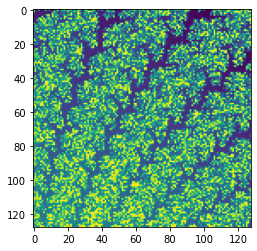

rb: 12770
Loss =  0.37504690885543823
Loss =  0.33705177903175354
Loss =  0.3378068208694458
Loss =  0.3513968586921692
Loss =  0.3754619359970093
Loss =  0.3743969798088074
Loss =  0.3914739489555359
Loss =  0.3651273846626282
Loss =  0.3438478708267212
Loss =  0.3073549270629883
Loss =  0.35679805278778076
Loss =  0.3786158859729767
Loss =  0.3028296232223511
Loss =  0.34446561336517334
Loss =  0.34398430585861206
Loss =  0.3831036686897278
Loss =  0.367520272731781
Loss =  0.41963738203048706
Loss =  0.3459608554840088
Loss =  0.36254745721817017
Loss =  0.33221936225891113
Loss =  0.2554926574230194
Loss =  0.36332571506500244
Loss =  0.32275915145874023
Loss =  0.3188667297363281
Loss =  0.32667630910873413
Loss =  0.3448779582977295
Loss =  0.28123944997787476
Loss =  0.32382458448410034
Loss =  0.38229089975357056
Loss =  0.3646557927131653
Loss =  0.2706964612007141
Loss =  0.3601285517215729
Loss =  0.32400667667388916
Loss =  0.3974683880805969
Loss =  0.3595588505268097
Loss

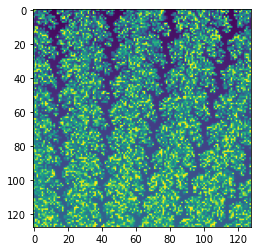

rb: 12970
Loss =  0.3856102228164673
Loss =  0.3817729949951172
Loss =  0.3454781770706177
Loss =  0.2790076434612274
Loss =  0.36234039068222046
Loss =  0.3968474268913269
Loss =  0.3624131381511688
Loss =  0.3174794614315033
Loss =  0.3825945556163788
Loss =  0.383056104183197
Loss =  0.3990245461463928
Loss =  0.3896421790122986
Loss =  0.4002947211265564
Loss =  0.32835257053375244
Loss =  0.40377283096313477
Loss =  0.3408411145210266
Loss =  0.4037338197231293
Loss =  0.327806293964386
Loss =  0.4630873203277588
Loss =  0.401356041431427
Loss =  0.3951026201248169
Loss =  0.41410189867019653
Loss =  0.33598780632019043
Loss =  0.38481271266937256
Loss =  0.37949854135513306
Loss =  0.38597118854522705
Loss =  0.3338935673236847
Loss =  0.3963894844055176
Loss =  0.3990251421928406
Loss =  0.3823707103729248
Loss =  0.412742555141449
Loss =  0.4043920636177063
Loss =  0.3209266662597656
Loss =  0.36697667837142944
Loss =  0.33840471506118774
Loss =  0.33733928203582764
Loss =  0.3

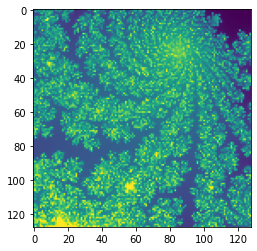

rb: 13170
Loss =  0.3139050602912903
Loss =  0.3826136291027069
Loss =  0.4021652340888977
Loss =  0.30443623661994934
Loss =  0.3686962127685547
Loss =  0.36411964893341064
Loss =  0.3773570656776428
Loss =  0.36593863368034363
Loss =  0.3254603445529938
Loss =  0.3636796772480011
Loss =  0.32667240500450134
Loss =  0.4043842554092407
Loss =  0.3512820601463318
Loss =  0.3328169882297516
Loss =  0.38868606090545654
Loss =  0.3276463747024536
Loss =  0.32292479276657104
Loss =  0.362394243478775
Loss =  0.34486186504364014
Loss =  0.36946535110473633
Loss =  0.4093084931373596
Loss =  0.38975343108177185
Loss =  0.3631538152694702
Loss =  0.3394505977630615
Loss =  0.36706042289733887
Loss =  0.33886682987213135
Loss =  0.3759692907333374
Loss =  0.31569063663482666
Loss =  0.35201364755630493
Loss =  0.35400477051734924
Loss =  0.37353578209877014
Loss =  0.3941984474658966
Loss =  0.36740726232528687
Loss =  0.3310033082962036
Loss =  0.31280726194381714
Loss =  0.3630945682525635
Lo

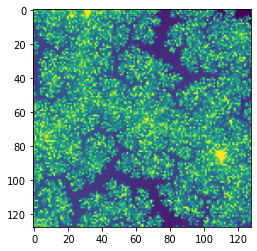

rb: 13370
Loss =  0.36945247650146484
Loss =  0.4336290657520294
Loss =  0.3996015191078186
Loss =  0.4142783284187317
Loss =  0.4057243764400482
Loss =  0.41915106773376465
Loss =  0.38268816471099854
Loss =  0.40378350019454956
Loss =  0.393515408039093
Loss =  0.4252750277519226
Loss =  0.39842450618743896
Loss =  0.37620285153388977
Loss =  0.43172866106033325
Loss =  0.46039965748786926
Loss =  0.3906964957714081
Loss =  0.380868136882782
Loss =  0.3937532305717468
Loss =  0.44992780685424805
Loss =  0.41251474618911743
Loss =  0.34925132989883423
Loss =  0.41718971729278564
Loss =  0.36408305168151855
Loss =  0.442682147026062
Loss =  0.3907170295715332
Loss =  0.34730035066604614
Loss =  0.4176672101020813
Loss =  0.39646464586257935
Loss =  0.3758472800254822
Loss =  0.3891688287258148
Loss =  0.35530686378479004
Loss =  0.39458927512168884
Loss =  0.3926410675048828
Loss =  0.38066595792770386
Loss =  0.40139999985694885
Loss =  0.3384876549243927
Loss =  0.39002466201782227
L

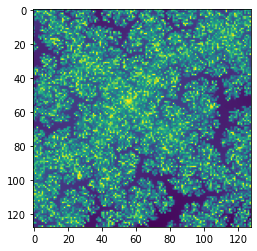

rb: 13570
Loss =  0.3428956866264343
Loss =  0.3479294776916504
Loss =  0.36391153931617737
Loss =  0.41933727264404297
Loss =  0.4082420766353607
Loss =  0.34852632880210876
Loss =  0.49053698778152466
Loss =  0.4137943983078003
Loss =  0.37290793657302856
Loss =  0.35648417472839355
Loss =  0.40716615319252014
Loss =  0.38273513317108154
Loss =  0.41543158888816833
Loss =  0.3792687952518463
Loss =  0.40436840057373047
Loss =  0.37185508012771606
Loss =  0.38160425424575806
Loss =  0.36624354124069214
Loss =  0.3910173177719116
Loss =  0.3933476209640503
Loss =  0.36654990911483765
Loss =  0.3877403438091278
Loss =  0.3401529788970947
Loss =  0.39539116621017456
Loss =  0.4147412180900574
Loss =  0.3515698313713074
Loss =  0.3928948938846588
Loss =  0.3955579102039337
Loss =  0.45161136984825134
Loss =  0.3671334683895111
Loss =  0.3749125599861145
Loss =  0.3584587574005127
Loss =  0.3613724708557129
Loss =  0.37964576482772827
Loss =  0.3880597651004791
Loss =  0.36095738410949707


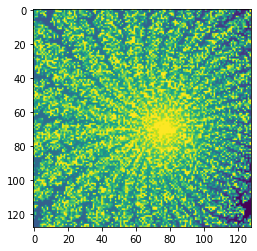

rb: 13770
Loss =  0.3566122353076935
Loss =  0.3831886053085327
Loss =  0.3845195174217224
Loss =  0.3424498438835144
Loss =  0.47120150923728943
Loss =  0.41233953833580017
Loss =  0.3682868778705597
Loss =  0.32006335258483887
Loss =  0.34463536739349365
Loss =  0.4093101918697357
Loss =  0.4034772217273712
Loss =  0.4055888056755066
Loss =  0.2829301059246063
Loss =  0.3793933391571045
Loss =  0.3530125617980957
Loss =  0.3749675750732422
Loss =  0.37005630135536194
Loss =  0.3701433539390564
Loss =  0.44314664602279663
Loss =  0.44158539175987244
Loss =  0.30752843618392944
Loss =  0.40428322553634644
Loss =  0.39612630009651184
Loss =  0.32165008783340454
Loss =  0.4036429524421692
Loss =  0.37210389971733093
Loss =  0.31546616554260254
Loss =  0.4411676526069641
Loss =  0.38883763551712036
Loss =  0.3743284046649933
Loss =  0.3423120975494385
Loss =  0.3487537205219269
Loss =  0.36958038806915283
Loss =  0.38421475887298584
Loss =  0.3373214304447174
Loss =  0.3205222487449646
Lo

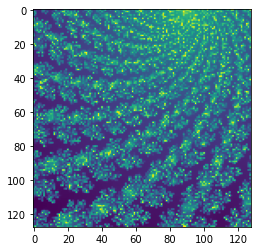

rb: 13970
Loss =  0.37224632501602173
Loss =  0.4132852256298065
Loss =  0.3950534760951996
Loss =  0.34404706954956055
Loss =  0.3829916715621948
Loss =  0.38541507720947266
Loss =  0.36109668016433716
Loss =  0.39600276947021484
Loss =  0.3684980869293213
Loss =  0.38997459411621094
Loss =  0.43491286039352417
Loss =  0.417363703250885
Loss =  0.38043200969696045
Loss =  0.360289603471756
Loss =  0.40523451566696167
Loss =  0.35694900155067444
Loss =  0.3906174898147583
Loss =  0.3528781235218048
Loss =  0.3846367597579956
Loss =  0.40154945850372314
Loss =  0.30700191855430603
Loss =  0.3392806649208069
Loss =  0.3789514899253845
Loss =  0.3039231598377228
Loss =  0.39984309673309326
Loss =  0.37221911549568176
Loss =  0.3918130397796631
Loss =  0.3265115022659302
Loss =  0.37137460708618164
Loss =  0.4155017137527466
Loss =  0.38217854499816895
Loss =  0.4033935070037842
Loss =  0.4300054907798767
Loss =  0.3395552933216095
Loss =  0.39839357137680054
Loss =  0.36485183238983154
Lo

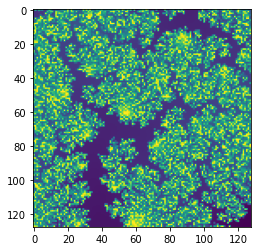

rb: 14170
Loss =  0.40272778272628784
Loss =  0.3874167501926422
Loss =  0.3632962703704834
Loss =  0.41281020641326904
Loss =  0.4132736027240753
Loss =  0.362062931060791
Loss =  0.36041074991226196
Loss =  0.38660794496536255
Loss =  0.3899472951889038
Loss =  0.3634225130081177
Loss =  0.43539702892303467
Loss =  0.3533858060836792
Loss =  0.38669875264167786
Loss =  0.4737279415130615
Loss =  0.42320746183395386
Loss =  0.37681668996810913
Loss =  0.38507741689682007
Loss =  0.3248201012611389
Loss =  0.37761008739471436
Loss =  0.3704383969306946
Loss =  0.37260180711746216
Loss =  0.377866268157959
Loss =  0.38951078057289124
Loss =  0.40781158208847046
Loss =  0.39337724447250366
Loss =  0.4231773614883423
Loss =  0.39566686749458313
Loss =  0.39262399077415466
Loss =  0.42158830165863037
Loss =  0.395843505859375
Loss =  0.39236366748809814
Loss =  0.3420718312263489
Loss =  0.3952643871307373
Loss =  0.36259379982948303
Loss =  0.3524010181427002
Loss =  0.40335947275161743
L

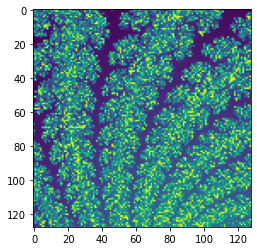

rb: 14370
Loss =  0.36327749490737915
Loss =  0.4759669601917267
Loss =  0.4316190481185913
Loss =  0.4452967643737793
Loss =  0.4546568691730499
Loss =  0.4276611804962158
Loss =  0.3800539970397949
Loss =  0.3822953701019287
Loss =  0.32491493225097656
Loss =  0.40215134620666504
Loss =  0.43090784549713135
Loss =  0.35661572217941284
Loss =  0.36422109603881836
Loss =  0.4239007234573364
Loss =  0.4196892976760864
Loss =  0.4058588147163391
Loss =  0.4299865961074829
Loss =  0.4174020290374756
Loss =  0.3871403932571411
Loss =  0.4326685667037964
Loss =  0.42040929198265076
Loss =  0.3631691336631775
Loss =  0.39873436093330383
Loss =  0.4234115779399872
Loss =  0.38770413398742676
Loss =  0.38888251781463623
Loss =  0.45869511365890503
Loss =  0.394535630941391
Loss =  0.39683759212493896
Loss =  0.3939887285232544
Loss =  0.38444268703460693
Loss =  0.3633712828159332
Loss =  0.3928106129169464
Loss =  0.3847152590751648
Loss =  0.44288724660873413
Loss =  0.4328317940235138
Loss 

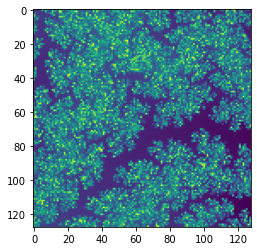

rb: 14570
Loss =  0.43998774886131287
Loss =  0.4050193428993225
Loss =  0.3992967903614044
Loss =  0.3869122564792633
Loss =  0.4443191885948181
Loss =  0.44492316246032715
Loss =  0.4296305179595947
Loss =  0.39576295018196106
Loss =  0.4042868912220001
Loss =  0.44041335582733154
Loss =  0.43243932723999023
Loss =  0.4078953266143799
Loss =  0.43219345808029175
Loss =  0.43651312589645386
Loss =  0.37577804923057556
Loss =  0.390924334526062
Loss =  0.44222408533096313
Loss =  0.3922751843929291
Loss =  0.38527852296829224
Loss =  0.3808945417404175
Loss =  0.4021223187446594
Loss =  0.366965115070343
Loss =  0.4023566246032715
Loss =  0.37109100818634033
Loss =  0.4059009850025177
Loss =  0.4057169556617737
Loss =  0.3680383861064911
Loss =  0.4175525903701782
Loss =  0.39106589555740356
Loss =  0.3690996766090393
Loss =  0.41799622774124146
Loss =  0.4438117742538452
Loss =  0.39561644196510315
Loss =  0.4301791787147522
Loss =  0.41045820713043213
Loss =  0.36343973875045776
Loss

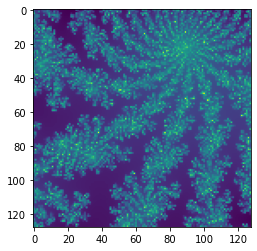

rb: 14770
Loss =  0.4738560914993286
Loss =  0.44774946570396423
Loss =  0.49151888489723206
Loss =  0.4025113880634308
Loss =  0.4291783273220062
Loss =  0.41755807399749756
Loss =  0.3819437026977539
Loss =  0.4634486436843872
Loss =  0.426798552274704
Loss =  0.45493555068969727
Loss =  0.4150576591491699
Loss =  0.42246416211128235
Loss =  0.3869907259941101
Loss =  0.4680579900741577
Loss =  0.44925811886787415
Loss =  0.4354986548423767
Loss =  0.4394218921661377
Loss =  0.4875251054763794
Loss =  0.49924972653388977
Loss =  0.4866095781326294
Loss =  0.39371487498283386
Loss =  0.41229474544525146
Loss =  0.4550172686576843
Loss =  0.4339723289012909
Loss =  0.41003090143203735
Loss =  0.4665982127189636
Loss =  0.43773353099823
Loss =  0.4404042363166809
Loss =  0.35908401012420654
Loss =  0.40747615694999695
Loss =  0.4389130175113678
Loss =  0.4689953029155731
Loss =  0.39532798528671265
Loss =  0.44534844160079956
Loss =  0.4111461043357849
Loss =  0.3782155513763428
Loss = 

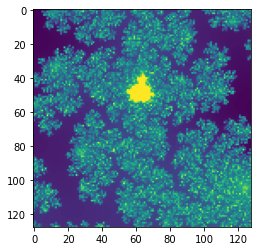

rb: 14970
Loss =  0.4364337921142578
Loss =  0.34972989559173584
Loss =  0.39167094230651855
Loss =  0.35879194736480713
Loss =  0.36580681800842285
Loss =  0.3958524167537689
Loss =  0.35731929540634155
Loss =  0.3608526289463043
Loss =  0.3818899095058441
Loss =  0.34501761198043823
Loss =  0.34942060708999634
Loss =  0.4000682234764099
Loss =  0.3856881856918335
Loss =  0.3469140827655792
Loss =  0.37273627519607544
Loss =  0.3536948561668396
Loss =  0.4120187759399414
Loss =  0.41623324155807495
Loss =  0.34751033782958984
Loss =  0.35061538219451904
Loss =  0.3898933529853821
Loss =  0.3932490944862366
Loss =  0.33343440294265747
Loss =  0.3997654318809509
Loss =  0.3847624659538269
Loss =  0.41098159551620483
Loss =  0.3459685146808624
Loss =  0.37242913246154785
Loss =  0.3638867735862732
Loss =  0.39558732509613037
Loss =  0.3827327489852905
Loss =  0.4071945548057556
Loss =  0.35415855050086975
Loss =  0.31721919775009155
Loss =  0.354910671710968
Loss =  0.3660576343536377
Lo

MemoryError: Unable to allocate 696. MiB for an array with shape (22280, 64, 64) and data type float64

In [19]:
import pickle

last = len(gallery)
for k in range(99999999999):
    for _ in range(10):
        sdfds()
        recursion(-1.5, .5, -1, 1, f=4)
    print(len(gallery), len(leafs_img), len(leafs_rect))

    for im in gallery_hr[last::55555555]:  # 5
        plt.imshow(im.T[::-1].astype('float64'))
        plt.show()
        
    new = np.stack(gallery[last:])
    replaybuffer = np.concatenate((new, replaybuffer))
    print('rb:', len(replaybuffer))
    last = len(gallery)
    
    for _ in range(100):
        p1 = np.exp(-1/500*np.arange(len(replaybuffer)))
        p2 = np.exp(-1/200000*np.arange(len(replaybuffer)))
        indf = lambda: np.concatenate((np.random.choice(range(len(new)), 16),  # at least one of the new
                                      np.random.choice(range(len(replaybuffer)), bnum//2, p=p1/sum(p1)),
                                      np.random.choice(range(len(replaybuffer)), bnum//2-16, p=p2/sum(p2)),))
        l = trainstep(indf)
        print('Loss = ', l)
    
    if k%50 == 0:
        with open('F:/$Daten/mandelbrot_gallery_both.pkl', 'wb') as f:
            pickle.dump((rects, gallery, gallery_hr), f)

In [ ]:
c = cost(leafs_img)

In [ ]:
import seaborn as sns

sns.distplot(c)

In [ ]:

while True:
    recursion(-1.5, .5, -1, 1, f=10)   ###### test mit höhem f, findet er feinere strukturen wie spiralen???
    
    new = np.asarray(gallery[-nrec:])
    new_hr = np.asarray(gallery_hr[-nrec:])
    for im in new_hr:
        plt.imshow(im.T[::-1])
        plt.show()
    replaybuffer = np.concatenate((new, replaybuffer))
    print('here')
    for _ in range(50):
        p1 = np.exp(-1/2000*np.arange(len(replaybuffer)))
        p2 = np.exp(-1/200000*np.arange(len(replaybuffer)))
        indf = lambda: np.concatenate((np.random.choice(range(len(new)), 16),  # at least one of the new
                                      np.random.choice(range(len(replaybuffer)), bnum//2, p=p1/sum(p1)),
                                      np.random.choice(range(len(replaybuffer)), bnum//2-16, p=p2/sum(p2)),))
        l = trainstep(indf)
        print('Loss = ', l)

In [ ]:
plt.imshow(mandel.T[::-1])
plt.show()

for im in gallery:
    plt.imshow(im.T[::-1])
    plt.show()

In [ ]:
xs = [x for x, _, y, _ in rects[25::26]]
ys = [y for x, _, y, _ in rects[25::26]]

In [ ]:
plt.imshow(mandel.T[::-1], extent=(-1.5, .5, -1, 1))
plt.scatter(xs, ys, s=1, c='r')

In [ ]:
i = 0

plt.imshow(gallery[i].T[::-1], extent=rects[i])
plt.scatter(xs, ys, s=1, c='r')
plt.xlim(rects[i][:2])
plt.ylim(rects[i][2:])

In [ ]:
import pickle
with open('F:/$Daten/mandelbrot_gallery2.pkl', 'wb') as f:
    pickle.dump((rects, gallery, gallery_hr), f)

In [5]:
import pickle
with open('F:/$Daten/mandelbrot_gallery_both.pkl', 'rb') as f:
    rects, gallery, gallery_hr = pickle.load(f)

In [6]:
from tqdm.notebook import trange
for i in trange(len(gallery_hr)):
    plt.imsave(f'F:/$Daten/mandelbrot_gallery/img{i}.jpg', gallery_hr[i].T[::-1])

  0%|          | 0/10985 [00:00<?, ?it/s]

In [13]:

n0 = 64
def render_mandel(rect, nmax=2000, n=n0, centered=True, cuda=False):
    xmin, xmax, ymin, ymax = rect
    xarr = np.linspace(xmin, xmax, n)
    yarr = np.linspace(ymin, ymax, n)
    if centered:
        xarr = np.linspace(xmin, xmax, n, endpoint=False) + (xmax-xmin)/n/2
        yarr = np.linspace(ymin, ymax, n, endpoint=False) + (ymax-ymin)/n/2
    xarr, yarr = meshgrid(xarr, yarr)
    if not cuda:
        mandel = mandelbrot(xarr, yarr, nmax)
    else:
        mandel = mandelbrot_cuda(xarr, yarr, nmax)
    mandel = np.log(mandel)
    mandel[np.isnan(mandel)] = 0
    return mandel


In [14]:
from tqdm.notebook import trange
from utils import *
for i in trange(len(gallery_hr)):
    for j in range(i):
        if np.allclose(rects[i], rects[j]):
            print(f'Skipping {i} as its close to {j}')
            break
    else:
        im = render_mandel(rects[i], n=512, cuda=True)
        im = downscale(im[None,:,:,None], 2)[0,:,:,0]
        plt.imsave(f'F:/$Daten/mandelbrot_gallery/img{i}_hr.png', im.T[::-1])
        im = render_mandel(rects[i], n=64, cuda=True)
        plt.imsave(f'F:/$Daten/mandelbrot_gallery/img{i}_lr.png', im.T[::-1])

  0%|          | 0/10985 [00:00<?, ?it/s]

C:\ProgramData\Anaconda3\lib\site-packages\ipykernel_launcher.py:14: RuntimeWarning: invalid value encountered in log
  


Skipping 30 as its close to 15
Skipping 35 as its close to 15
Skipping 36 as its close to 16
Skipping 37 as its close to 17
Skipping 38 as its close to 18
Skipping 39 as its close to 19
Skipping 40 as its close to 20
Skipping 41 as its close to 21
Skipping 55 as its close to 15
Skipping 56 as its close to 16
Skipping 75 as its close to 15
Skipping 76 as its close to 16
Skipping 77 as its close to 17
Skipping 78 as its close to 18
Skipping 79 as its close to 19
Skipping 80 as its close to 20
Skipping 81 as its close to 21
Skipping 82 as its close to 42
Skipping 83 as its close to 43
Skipping 84 as its close to 44
Skipping 90 as its close to 16
Skipping 95 as its close to 15
Skipping 96 as its close to 16
Skipping 97 as its close to 17
Skipping 98 as its close to 18
Skipping 99 as its close to 19
Skipping 115 as its close to 15
Skipping 116 as its close to 16
Skipping 117 as its close to 17
Skipping 118 as its close to 18
Skipping 119 as its close to 19
Skipping 120 as its close to 20
Sk

Skipping 817 as its close to 797
Skipping 825 as its close to 768
Skipping 826 as its close to 806
Skipping 827 as its close to 806
Skipping 828 as its close to 806
Skipping 829 as its close to 806
Skipping 830 as its close to 807
Skipping 831 as its close to 770
Skipping 832 as its close to 731
Skipping 833 as its close to 768
Skipping 834 as its close to 731
Skipping 835 as its close to 34
Skipping 836 as its close to 710
Skipping 837 as its close to 797
Skipping 838 as its close to 818
Skipping 839 as its close to 819
Skipping 840 as its close to 820
Skipping 841 as its close to 821
Skipping 842 as its close to 822
Skipping 843 as its close to 823
Skipping 844 as its close to 824
Skipping 855 as its close to 34
Skipping 856 as its close to 710
Skipping 857 as its close to 797
Skipping 858 as its close to 818
Skipping 859 as its close to 819
Skipping 860 as its close to 820
Skipping 861 as its close to 821
Skipping 862 as its close to 822
Skipping 863 as its close to 823
Skipping 864

Skipping 1335 as its close to 31
Skipping 1336 as its close to 316
Skipping 1337 as its close to 317
Skipping 1338 as its close to 318
Skipping 1339 as its close to 1246
Skipping 1340 as its close to 1288
Skipping 1341 as its close to 1325
Skipping 1348 as its close to 1221
Skipping 1355 as its close to 31
Skipping 1356 as its close to 316
Skipping 1357 as its close to 317
Skipping 1358 as its close to 318
Skipping 1359 as its close to 1219
Skipping 1360 as its close to 1220
Skipping 1361 as its close to 1221
Skipping 1362 as its close to 1222
Skipping 1363 as its close to 1223
Skipping 1364 as its close to 1224
Skipping 1374 as its close to 320
Skipping 1375 as its close to 31
Skipping 1376 as its close to 316
Skipping 1377 as its close to 317
Skipping 1378 as its close to 318
Skipping 1379 as its close to 1219
Skipping 1380 as its close to 1220
Skipping 1381 as its close to 1221
Skipping 1382 as its close to 1222
Skipping 1395 as its close to 1
Skipping 1396 as its close to 716
Skipp

Skipping 1915 as its close to 32
Skipping 1916 as its close to 305
Skipping 1917 as its close to 387
Skipping 1918 as its close to 785
Skipping 1919 as its close to 947
Skipping 1920 as its close to 1880
Skipping 1921 as its close to 1881
Skipping 1922 as its close to 1882
Skipping 1923 as its close to 1883
Skipping 1924 as its close to 1883
Skipping 1935 as its close to 32
Skipping 1936 as its close to 305
Skipping 1937 as its close to 387
Skipping 1938 as its close to 446
Skipping 1939 as its close to 585
Skipping 1940 as its close to 1860
Skipping 1941 as its close to 1861
Skipping 1942 as its close to 1862
Skipping 1943 as its close to 1863
Skipping 1944 as its close to 1863
Skipping 1945 as its close to 1212
Skipping 1946 as its close to 1405
Skipping 1947 as its close to 1212
Skipping 1948 as its close to 1405
Skipping 1949 as its close to 1212
Skipping 1950 as its close to 1688
Skipping 1951 as its close to 1688
Skipping 1952 as its close to 1688
Skipping 1953 as its close to 14

Skipping 2544 as its close to 2444
Skipping 2555 as its close to 415
Skipping 2556 as its close to 1136
Skipping 2557 as its close to 2397
Skipping 2558 as its close to 2398
Skipping 2559 as its close to 2399
Skipping 2560 as its close to 2520
Skipping 2575 as its close to 415
Skipping 2576 as its close to 1136
Skipping 2577 as its close to 2397
Skipping 2578 as its close to 2398
Skipping 2579 as its close to 2399
Skipping 2580 as its close to 2520
Skipping 2581 as its close to 2521
Skipping 2582 as its close to 2522
Skipping 2583 as its close to 2523
Skipping 2584 as its close to 2524
Skipping 2595 as its close to 31
Skipping 2596 as its close to 952
Skipping 2597 as its close to 1197
Skipping 2598 as its close to 1198
Skipping 2599 as its close to 1199
Skipping 2609 as its close to 2568
Skipping 2615 as its close to 31
Skipping 2616 as its close to 952
Skipping 2617 as its close to 1197
Skipping 2618 as its close to 1198
Skipping 2619 as its close to 1199
Skipping 2620 as its close t

Skipping 3095 as its close to 1595
Skipping 3096 as its close to 2996
Skipping 3097 as its close to 2997
Skipping 3115 as its close to 34
Skipping 3116 as its close to 707
Skipping 3135 as its close to 1595
Skipping 3136 as its close to 1716
Skipping 3137 as its close to 1717
Skipping 3138 as its close to 1718
Skipping 3139 as its close to 1719
Skipping 3140 as its close to 1720
Skipping 3141 as its close to 3041
Skipping 3142 as its close to 3042
Skipping 3143 as its close to 3043
Skipping 3144 as its close to 3044
Skipping 3145 as its close to 2927
Skipping 3147 as its close to 2928
Skipping 3148 as its close to 3031
Skipping 3149 as its close to 2848
Skipping 3150 as its close to 2927
Skipping 3151 as its close to 2848
Skipping 3152 as its close to 2928
Skipping 3153 as its close to 2928
Skipping 3154 as its close to 3033
Skipping 3155 as its close to 1595
Skipping 3156 as its close to 1716
Skipping 3157 as its close to 1717
Skipping 3158 as its close to 1718
Skipping 3159 as its cl

Skipping 3675 as its close to 415
Skipping 3676 as its close to 3596
Skipping 3677 as its close to 3637
Skipping 3678 as its close to 3638
Skipping 3679 as its close to 3639
Skipping 3680 as its close to 3640
Skipping 3681 as its close to 3641
Skipping 3682 as its close to 3642
Skipping 3683 as its close to 3643
Skipping 3684 as its close to 3643
Skipping 3695 as its close to 415
Skipping 3696 as its close to 3596
Skipping 3697 as its close to 3637
Skipping 3698 as its close to 3638
Skipping 3699 as its close to 3639
Skipping 3700 as its close to 3640
Skipping 3701 as its close to 3641
Skipping 3702 as its close to 3642
Skipping 3703 as its close to 3643
Skipping 3704 as its close to 3643
Skipping 3705 as its close to 3666
Skipping 3710 as its close to 3670
Skipping 3711 as its close to 3666
Skipping 3715 as its close to 415
Skipping 3716 as its close to 3596
Skipping 3717 as its close to 3637
Skipping 3718 as its close to 3638
Skipping 3719 as its close to 3639
Skipping 3720 as its cl

Skipping 4189 as its close to 3948
Skipping 4190 as its close to 4051
Skipping 4191 as its close to 3428
Skipping 4193 as its close to 3670
Skipping 4195 as its close to 15
Skipping 4196 as its close to 16
Skipping 4197 as its close to 57
Skipping 4198 as its close to 58
Skipping 4199 as its close to 59
Skipping 4200 as its close to 60
Skipping 4201 as its close to 61
Skipping 4202 as its close to 62
Skipping 4203 as its close to 63
Skipping 4215 as its close to 15
Skipping 4216 as its close to 131
Skipping 4227 as its close to 3670
Skipping 4228 as its close to 3948
Skipping 4229 as its close to 3969
Skipping 4230 as its close to 4051
Skipping 4233 as its close to 3670
Skipping 4235 as its close to 15
Skipping 4236 as its close to 131
Skipping 4237 as its close to 4217
Skipping 4238 as its close to 4218
Skipping 4239 as its close to 4219
Skipping 4240 as its close to 4220
Skipping 4241 as its close to 4221
Skipping 4255 as its close to 15
Skipping 4256 as its close to 16
Skipping 4257

Skipping 4770 as its close to 4589
Skipping 4771 as its close to 4494
Skipping 4773 as its close to 4589
Skipping 4774 as its close to 4625
Skipping 4775 as its close to 1595
Skipping 4776 as its close to 1596
Skipping 4777 as its close to 1597
Skipping 4778 as its close to 1598
Skipping 4779 as its close to 1659
Skipping 4780 as its close to 1660
Skipping 4781 as its close to 4601
Skipping 4804 as its close to 4803
Skipping 4811 as its close to 4765
Skipping 4812 as its close to 4765
Skipping 4815 as its close to 4795
Skipping 4816 as its close to 4796
Skipping 4817 as its close to 4797
Skipping 4818 as its close to 4798
Skipping 4819 as its close to 4799
Skipping 4824 as its close to 4823
Skipping 4825 as its close to 4813
Skipping 4827 as its close to 4707
Skipping 4828 as its close to 4810
Skipping 4829 as its close to 4827
Skipping 4831 as its close to 4611
Skipping 4832 as its close to 4708
Skipping 4833 as its close to 4810
Skipping 4834 as its close to 4434
Skipping 4835 as its

Skipping 5345 as its close to 5207
Skipping 5346 as its close to 5207
Skipping 5349 as its close to 5205
Skipping 5351 as its close to 5207
Skipping 5352 as its close to 5205
Skipping 5353 as its close to 5207
Skipping 5354 as its close to 5225
Skipping 5355 as its close to 15
Skipping 5356 as its close to 656
Skipping 5357 as its close to 1834
Skipping 5358 as its close to 5218
Skipping 5359 as its close to 5219
Skipping 5360 as its close to 5220
Skipping 5361 as its close to 5221
Skipping 5362 as its close to 5222
Skipping 5363 as its close to 5283
Skipping 5364 as its close to 5284
Skipping 5375 as its close to 15
Skipping 5376 as its close to 656
Skipping 5377 as its close to 1834
Skipping 5378 as its close to 5218
Skipping 5379 as its close to 5219
Skipping 5380 as its close to 5220
Skipping 5381 as its close to 5221
Skipping 5382 as its close to 5222
Skipping 5383 as its close to 5283
Skipping 5384 as its close to 5284
Skipping 5395 as its close to 1595
Skipping 5415 as its close

Skipping 6015 as its close to 415
Skipping 6016 as its close to 3416
Skipping 6017 as its close to 3417
Skipping 6018 as its close to 5998
Skipping 6019 as its close to 5999
Skipping 6020 as its close to 6000
Skipping 6021 as its close to 6001
Skipping 6022 as its close to 6002
Skipping 6023 as its close to 6003
Skipping 6024 as its close to 6003
Skipping 6035 as its close to 415
Skipping 6036 as its close to 3416
Skipping 6037 as its close to 3417
Skipping 6038 as its close to 5998
Skipping 6039 as its close to 5999
Skipping 6040 as its close to 6000
Skipping 6055 as its close to 415
Skipping 6056 as its close to 3416
Skipping 6057 as its close to 3417
Skipping 6058 as its close to 3418
Skipping 6064 as its close to 6063
Skipping 6075 as its close to 415
Skipping 6076 as its close to 3416
Skipping 6077 as its close to 3417
Skipping 6078 as its close to 5998
Skipping 6079 as its close to 5999
Skipping 6080 as its close to 6000
Skipping 6081 as its close to 6001
Skipping 6082 as its clo

Skipping 6521 as its close to 6401
Skipping 6522 as its close to 6402
Skipping 6523 as its close to 6403
Skipping 6524 as its close to 6403
Skipping 6526 as its close to 6488
Skipping 6527 as its close to 6325
Skipping 6528 as its close to 6525
Skipping 6529 as its close to 6487
Skipping 6530 as its close to 6433
Skipping 6531 as its close to 6433
Skipping 6532 as its close to 6426
Skipping 6533 as its close to 6465
Skipping 6534 as its close to 6465
Skipping 6535 as its close to 15
Skipping 6536 as its close to 1113
Skipping 6537 as its close to 1187
Skipping 6538 as its close to 1252
Skipping 6539 as its close to 1305
Skipping 6548 as its close to 6525
Skipping 6550 as its close to 6525
Skipping 6551 as its close to 6525
Skipping 6555 as its close to 15
Skipping 6556 as its close to 1113
Skipping 6557 as its close to 1187
Skipping 6558 as its close to 1252
Skipping 6559 as its close to 1305
Skipping 6560 as its close to 6400
Skipping 6561 as its close to 6401
Skipping 6562 as its clo

Skipping 7139 as its close to 7099
Skipping 7140 as its close to 7100
Skipping 7141 as its close to 7101
Skipping 7145 as its close to 6525
Skipping 7146 as its close to 7114
Skipping 7147 as its close to 6465
Skipping 7148 as its close to 6465
Skipping 7150 as its close to 7114
Skipping 7152 as its close to 7114
Skipping 7153 as its close to 6465
Skipping 7155 as its close to 31
Skipping 7156 as its close to 1069
Skipping 7157 as its close to 7037
Skipping 7158 as its close to 7098
Skipping 7159 as its close to 7099
Skipping 7160 as its close to 7100
Skipping 7161 as its close to 7101
Skipping 7162 as its close to 7102
Skipping 7175 as its close to 31
Skipping 7176 as its close to 952
Skipping 7195 as its close to 1595
Skipping 7196 as its close to 5416
Skipping 7197 as its close to 5417
Skipping 7198 as its close to 5418
Skipping 7199 as its close to 5419
Skipping 7215 as its close to 1595
Skipping 7216 as its close to 5416
Skipping 7217 as its close to 5417
Skipping 7218 as its clos

Skipping 7680 as its close to 7640
Skipping 7681 as its close to 7641
Skipping 7682 as its close to 7642
Skipping 7684 as its close to 7683
Skipping 7685 as its close to 6525
Skipping 7687 as its close to 6525
Skipping 7688 as its close to 7586
Skipping 7689 as its close to 6445
Skipping 7690 as its close to 4592
Skipping 7691 as its close to 4765
Skipping 7692 as its close to 7274
Skipping 7694 as its close to 5950
Skipping 7695 as its close to 294
Skipping 7696 as its close to 370
Skipping 7697 as its close to 7597
Skipping 7698 as its close to 7598
Skipping 7699 as its close to 7599
Skipping 7700 as its close to 7600
Skipping 7701 as its close to 7601
Skipping 7702 as its close to 7602
Skipping 7703 as its close to 7603
Skipping 7704 as its close to 7603
Skipping 7715 as its close to 294
Skipping 7716 as its close to 691
Skipping 7717 as its close to 747
Skipping 7725 as its close to 5950
Skipping 7726 as its close to 5950
Skipping 7727 as its close to 5950
Skipping 7729 as its clos

Skipping 8238 as its close to 8198
Skipping 8239 as its close to 8199
Skipping 8240 as its close to 8200
Skipping 8241 as its close to 8201
Skipping 8242 as its close to 8202
Skipping 8243 as its close to 8203
Skipping 8244 as its close to 8204
Skipping 8255 as its close to 415
Skipping 8256 as its close to 3596
Skipping 8257 as its close to 3637
Skipping 8258 as its close to 3638
Skipping 8264 as its close to 8263
Skipping 8275 as its close to 1815
Skipping 8276 as its close to 8196
Skipping 8277 as its close to 8197
Skipping 8278 as its close to 8198
Skipping 8295 as its close to 1815
Skipping 8296 as its close to 8196
Skipping 8297 as its close to 8197
Skipping 8298 as its close to 8198
Skipping 8299 as its close to 8199
Skipping 8300 as its close to 8200
Skipping 8301 as its close to 8201
Skipping 8302 as its close to 8202
Skipping 8303 as its close to 8203
Skipping 8304 as its close to 8204
Skipping 8315 as its close to 1815
Skipping 8316 as its close to 8196
Skipping 8317 as its 

Skipping 8876 as its close to 8796
Skipping 8877 as its close to 8797
Skipping 8878 as its close to 8798
Skipping 8879 as its close to 8799
Skipping 8880 as its close to 8800
Skipping 8881 as its close to 8801
Skipping 8882 as its close to 8802
Skipping 8883 as its close to 8803
Skipping 8884 as its close to 8804
Skipping 8895 as its close to 1595
Skipping 8896 as its close to 1596
Skipping 8897 as its close to 1597
Skipping 8898 as its close to 1678
Skipping 8899 as its close to 1679
Skipping 8900 as its close to 1680
Skipping 8905 as its close to 8673
Skipping 8907 as its close to 4854
Skipping 8908 as its close to 4849
Skipping 8910 as its close to 4930
Skipping 8911 as its close to 8869
Skipping 8913 as its close to 8785
Skipping 8914 as its close to 5885
Skipping 8915 as its close to 1595
Skipping 8916 as its close to 1596
Skipping 8917 as its close to 1597
Skipping 8918 as its close to 1678
Skipping 8919 as its close to 1679
Skipping 8920 as its close to 1680
Skipping 8921 as its

Skipping 9392 as its close to 9285
Skipping 9393 as its close to 4426
Skipping 9394 as its close to 6525
Skipping 9395 as its close to 415
Skipping 9396 as its close to 1136
Skipping 9397 as its close to 1137
Skipping 9398 as its close to 1138
Skipping 9399 as its close to 1139
Skipping 9405 as its close to 9389
Skipping 9407 as its close to 7986
Skipping 9408 as its close to 4426
Skipping 9409 as its close to 6589
Skipping 9410 as its close to 5628
Skipping 9411 as its close to 8673
Skipping 9412 as its close to 7445
Skipping 9413 as its close to 8785
Skipping 9414 as its close to 6589
Skipping 9415 as its close to 415
Skipping 9416 as its close to 1136
Skipping 9425 as its close to 8673
Skipping 9426 as its close to 6589
Skipping 9427 as its close to 7445
Skipping 9428 as its close to 7305
Skipping 9429 as its close to 8989
Skipping 9431 as its close to 4592
Skipping 9432 as its close to 4986
Skipping 9433 as its close to 7234
Skipping 9434 as its close to 4589
Skipping 9435 as its c

Skipping 9876 as its close to 7396
Skipping 9877 as its close to 7397
Skipping 9878 as its close to 7398
Skipping 9884 as its close to 9883
Skipping 9885 as its close to 9870
Skipping 9886 as its close to 9873
Skipping 9887 as its close to 6426
Skipping 9888 as its close to 3428
Skipping 9890 as its close to 5950
Skipping 9891 as its close to 5425
Skipping 9892 as its close to 6525
Skipping 9893 as its close to 8989
Skipping 9895 as its close to 787
Skipping 9896 as its close to 7396
Skipping 9897 as its close to 7397
Skipping 9898 as its close to 7398
Skipping 9899 as its close to 7399
Skipping 9900 as its close to 9800
Skipping 9901 as its close to 9801
Skipping 9904 as its close to 9903
Skipping 9915 as its close to 787
Skipping 9916 as its close to 7396
Skipping 9917 as its close to 7397
Skipping 9918 as its close to 7398
Skipping 9919 as its close to 7399
Skipping 9920 as its close to 7400
Skipping 9921 as its close to 9821
Skipping 9922 as its close to 9822
Skipping 9923 as its c

Skipping 10344 as its close to 10224
Skipping 10345 as its close to 7251
Skipping 10346 as its close to 10308
Skipping 10347 as its close to 7251
Skipping 10348 as its close to 6426
Skipping 10349 as its close to 5628
Skipping 10350 as its close to 10087
Skipping 10351 as its close to 8347
Skipping 10352 as its close to 9928
Skipping 10353 as its close to 8749
Skipping 10354 as its close to 5772
Skipping 10355 as its close to 1
Skipping 10356 as its close to 2
Skipping 10375 as its close to 31
Skipping 10376 as its close to 1069
Skipping 10377 as its close to 6917
Skipping 10378 as its close to 6918
Skipping 10379 as its close to 6919
Skipping 10380 as its close to 6920
Skipping 10395 as its close to 209
Skipping 10396 as its close to 247
Skipping 10397 as its close to 309
Skipping 10398 as its close to 345
Skipping 10405 as its close to 5628
Skipping 10406 as its close to 10392
Skipping 10408 as its close to 7251
Skipping 10409 as its close to 4965
Skipping 10410 as its close to 10311

Skipping 10836 as its close to 10796
Skipping 10837 as its close to 10797
Skipping 10838 as its close to 10798
Skipping 10839 as its close to 10799
Skipping 10855 as its close to 1815
Skipping 10856 as its close to 10796
Skipping 10857 as its close to 10797
Skipping 10858 as its close to 10798
Skipping 10859 as its close to 10799
Skipping 10860 as its close to 10840
Skipping 10861 as its close to 10841
Skipping 10862 as its close to 10842
Skipping 10875 as its close to 1815
Skipping 10876 as its close to 10796
Skipping 10877 as its close to 10797
Skipping 10878 as its close to 10798
Skipping 10879 as its close to 10799
Skipping 10880 as its close to 10840
Skipping 10881 as its close to 10841
Skipping 10895 as its close to 1815
Skipping 10896 as its close to 10796
Skipping 10897 as its close to 10797
Skipping 10898 as its close to 10798
Skipping 10899 as its close to 10799
Skipping 10900 as its close to 10840
Skipping 10901 as its close to 10841
Skipping 10902 as its close to 10842
Skip